# Init

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np

from src.general_analysis.engine import AnalysisEnvironment
from src.barter.regression_models import create_regression_runner
from src.utils import interactive_regression_results_selector

# Load data

In [3]:
env = AnalysisEnvironment(active_analysis='barter_deals', sandbox_mode=False)

# Load everything
final_df, og_df = env.load_data(use_cache=True, force_refresh=False)
pm, prompt_map = env.load_prompts()

Loading files for analysis Barter Deals Analysis
⚡ Loading cached DataFrame from C:\Users\Wouter Barter\Documents\AI_thesis\results\BARTER_DEALS\BARTER_DEALS_analysis_ready.pkl...
PromptManager initialized with folder: ..\prompts\PromptSuites\BARTER_DEALS
Scanning 7 suites from ..\prompts\PromptSuites\BARTER_DEALS...
Loaded 7 PromptSuites


In [4]:
og_df

,applicants_applications_count,content_types,deal_id,main_image,min_social_media_followers,deal_tags,live_since,first_application_at,last_application_at,company_locations,...,req_facebook,platform_count,platform_strategy,raw_input_word_count,log_apps_after_7_days,log_deal_value,log_title_word_count,log_text_word_count,log_requirements_word_count,log_competitor_density
0,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,0,1,Instagram_Only,53,2.302585,5.669881,1.945910,3.258097,3.135494,0.000000
1,8,"[{'id': 41, 'name': 'Activities', 'slug': 'per...",01968af1-f78d-00c8-d1f0-b6ea4e7f3251,uploads/deals/01968af0-f987-ffff-16c0-e833ccff...,2500,None,2025-05-01 08:23:55.697617,2025-05-01 12:16:14.626582,2025-05-04 19:08:46.280439,"[{""id"": ""01KERJ26D105FM72RARYSMA2AW"", ""name"": ...",...,0,2,IG_and_TikTok,68,2.197225,0.000000,1.945910,3.401197,3.526361,1.609438
2,21,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'...",01968b03-f7b6-00c8-4ac5-f92b235aa10d,uploads/deals/01968aff-9f67-ffff-dea2-0def50c9...,10000,None,2025-05-01 08:43:35.350826,2025-05-01 10:54:50.019465,2025-11-19 22:40:24.416572,"[{""id"": ""01KERHSGS605FV5KNYGEBG6FME"", ""name"": ...",...,0,1,Instagram_Only,96,1.609438,NaN,2.079442,3.688879,3.931826,1.386294
3,21,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'...",01968b0b-b879-00c8-470e-044f1e26e293,uploads/deals/01968b0b-62d6-ffff-2af8-f62cb203...,5000,None,2025-05-01 08:52:03.597239,2025-05-01 17:24:20.747332,2025-12-01 09:35:34.914363,"[{""id"": ""01KERHSGS605FV5KNYGEBG6FME"", ""name"": ...",...,0,1,Instagram_Only,67,1.386294,NaN,2.197225,3.688879,3.044522,1.386294
4,10,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'...",01968b1a-621a-00c8-eb2a-36b7f3ee8694,uploads/deals/01968b19-9ced-ffff-b45c-85efb252...,5000,None,2025-05-01 09:08:04.376892,2025-05-01 10:18:05.456020,2025-11-19 22:36:57.476841,None,...,0,1,Instagram_Only,138,1.098612,NaN,2.197225,4.488636,3.761200,1.386294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3419,37,"[{'id': 39, 'name': 'Experiences', 'slug': 'Te...",019cd2c5-58c5-00c8-7191-1b4d225c997d,uploads/deals/019cd2c3-eb0b-ffff-f986-e5f5e04a...,10000,None,2026-03-09 13:24:34.783518,2026-03-09 13:31:45.295401,2026-03-23 10:42:09.855831,None,...,0,1,TikTok_Only,296,3.433987,0.000000,1.791759,4.543295,5.293305,1.609438
3420,309,"[{'id': 39, 'name': 'Experiences', 'slug': 'Te...",019cd2f6-0b38-00c8-8632-d21f82239d99,uploads/deals/019cd2f4-ea18-ffff-22cf-7f051c10...,2500,None,2026-03-09 14:17:46.161271,2026-03-09 14:20:45.600022,2026-03-23 23:28:29.743306,None,...,0,2,IG_and_TikTok,344,5.529429,7.467942,2.197225,5.690359,3.737670,1.609438
3421,60,"[{'id': 41, 'name': 'Activities', 'slug': 'per...",019cd345-8059-00c8-4f76-2022ec342341,uploads/deals/019cd344-fbc3-ffff-a966-1937e0f6...,2500,None,2026-03-09 16:05:33.903411,2026-03-09 16:15:45.752355,2026-03-23 21:20:47.153978,None,...,0,2,IG_and_TikTok,200,4.007333,0.000000,2.302585,4.852030,4.174387,0.000000
3422,2,"[{'id': 29, 'name': 'UGC', 'slug': 'Film-Strip...",019cd3d5-cb91-00c8-8ba0-4dc62e4c938e,uploads/deals/019cd3d3-5df8-ffff-d3fd-6aeeda86...,2500,None,2026-03-09 18:29:41.700566,2026-03-12 06:35:48.124634,2026-03-16 22:29:27.224174,None,...,0,0,Unspecified,170,0.693147,4.615121,1.791759,3.951244,4.744932,0.000000


# Data pre-processing

## Updated at minus created at

In [5]:
def create_time_to_update_hours_col(df):

    df["time_to_update_hours"] = (
        df["updated_at"] - df["created_at"]
    ).dt.total_seconds() / 3600

    # small tolerance because created_at and updated_at may differ by seconds automatically
    tol = 1 / 60  # one minute

    df["was_updated"] = df["time_to_update_hours"] > tol

    df["update_window"] = pd.cut(
        df["time_to_update_hours"],
        bins=[-0.001, tol, 1, 24, 168, float("inf")],
        labels=[
            "no_or_instant_update",
            "within_1h",
            "1h_to_24h",
            "1d_to_7d",
            "after_7d"
        ],
        include_lowest=True
    )
    return df


og_df = create_time_to_update_hours_col(og_df)
final_df = create_time_to_update_hours_col(final_df)

In [6]:
# og_df['updated_at_minus_created_at'] = og_df['updated_at'] - og_df['created_at']
# og_df['duration_hours'] = (og_df['updated_at'] - og_df['created_at']).dt.total_seconds() / 3600


# 1. Calculate raw duration in hours (or days)
og_df['exposure_hours'] = (pd.to_datetime(
    og_df['updated_at']) - pd.to_datetime(og_df['created_at'])).dt.total_seconds() / 3600

# 2. Clip at a minimum threshold to prevent log(0) or negative time anomalies
# A deal online for 5 minutes is treated as online for 1 hour to stabilize the math
og_df['exposure_hours'] = og_df['exposure_hours'].clip(lower=1.0)

# 3. Apply the natural logarithm
og_df['log_exposure'] = np.log(og_df['exposure_hours'])

In [7]:
import numpy as np

# 1. Calculate raw duration in hours
raw_hours = (pd.to_datetime(
    og_df['updated_at']) - pd.to_datetime(og_df['created_at'])).dt.total_seconds() / 3600

# 2. Handle missing updated_at (assume deals without an end date survived the full 7 days)
raw_hours = raw_hours.fillna(168.0)

# 3. Cap strictly between 1 hour and 168 hours
# Lower bound prevents log(0), upper bound aligns with 'apps_after_7_days'
og_df['exposure_hours'] = raw_hours.clip(lower=1.0, upper=168.0)

# 4. Apply log link
og_df['log_exposure'] = np.log(og_df['exposure_hours'])

In [8]:
import numpy as np

# 1. Calculate raw duration in hours
raw_hours = (pd.to_datetime(
    final_df['updated_at']) - pd.to_datetime(final_df['created_at'])).dt.total_seconds() / 3600

# 2. Handle missing updated_at (assume deals without an end date survived the full 7 days)
raw_hours = raw_hours.fillna(168.0)

# 3. Cap strictly between 1 hour and 168 hours
# Lower bound prevents log(0), upper bound aligns with 'apps_after_7_days'
final_df['exposure_hours'] = raw_hours.clip(lower=1.0, upper=168.0)

# 4. Apply log link
final_df['log_exposure'] = np.log(final_df['exposure_hours'])

## Market scope

In [9]:
import pandas as pd
import numpy as np


def create_market_scope(df: pd.DataFrame) -> pd.DataFrame:
    """Calculates the Tier-based market scope proxy."""
    df = df.copy()

    def _get_tier(row):
        countries = row.get('accepted_countries', [])
        if not isinstance(countries, (list, np.ndarray)):
            countries = []
        c_set = set(countries)

        # 1. Multi-country / Broad Markets
        if len(c_set) > 1:
            if "NLD" in c_set:
                return "Tier1_NLD_international"
            else:
                # Properly captures broad EU deals like ['GBR', 'BEL', 'DEU', 'FRA']
                return "Tier1_NonNLD_international"

        # 2. Single-Country Specific Markets
        if c_set == {"NLD"}:
            return "Tier2_NLD_only"
        elif c_set == {"BEL"}:
            return "Tier3_BEL_Only"
        elif "DEU" in c_set:
            return "Tier4_Germany"

        # 3. Fallback for unexpected single countries (e.g., {"GBR"} only)
        return "Tier5_Other"

    df['market_scope'] = df.apply(_get_tier, axis=1)
    return df


og_df = create_market_scope(og_df)
final_df = create_market_scope(final_df)

## Filter out zero-word text rows

In [10]:
final_df = final_df[~((final_df['text_word_count'] < 2) &
                      (final_df['requirements_word_count'] < 2))]

## Human readable cols

In [11]:
# Human readable prompt names

# prompt_map_clean = {
#     'dbadc59142e9': 'Holistic Naive (1D)',
#     '38c4714f0e3a': 'Holistic Informed (3D)',
#     '1e1ff82a28e2': 'Formative (10D)'
# }

prompt_map_clean = {
    'dbadc59142e9': 'Holistic Naive',
    '38c4714f0e3a': 'Macro-Formative',
    '1e1ff82a28e2': 'Formative'
}


final_df['prompt_name'] = final_df['prompt_id'].map(prompt_map_clean)


# Analysis group concatenation

final_df['analysis_group'] = final_df['model_name'] + \
    "_" + final_df['prompt_id']
final_df['analysis_group_full'] = final_df['model_name'] + "_" + \
    final_df['prompt_id'] + "_" + final_df['dimension_name']
final_df['analysis_group_named'] = final_df['model_name'] + \
    "_" + final_df['prompt_name'] + "_" + final_df['prompt_id']

# Human readable model col
model_map_clean = {
    'google/gemma-4-E2B-it': "Gemma 4",
    'meta-llama/Llama-3.2-3B-Instruct': "Llama 3.2",
    'Qwen/Qwen3-4B-Instruct-2507': "Qwen 3",
    'Qwen/Qwen3.5-4B': "Qwen 3.5"
}
final_df['model_name_clean'] = final_df['model_name'].map(model_map_clean)


# Clean dimension names
dim_map_clean = {
    # Holistic
    'deal_pitch_overall_deal_attractiveness': 'Holistic\nDeal Attractiveness',

    # Macro-Formative
    'deal_pitch_overall_reward_value': 'Macro-Formative\nReward Value',
    'deal_pitch_overall_task_demand': 'Macro-Formative\nTask Demand',
    'deal_pitch_overall_pitch_quality': 'Macro-Formative\nPitch Quality',

    # Formative
    'deal_pitch_brand_prestige': 'Formative\nBrand Prestige',
    'deal_pitch_perceived_economic_value': 'Formative\nPerceived Economic Value',
    'deal_pitch_creator_brand_alignment': 'Formative\nCreator Brand Alignment',
    'deal_pitch_functional_utility': 'Formative\nFunctional Utility',
    'deal_pitch_product_universality': 'Formative\nProduct Universality',
    'deal_pitch_workload_volume': 'Formative\nWorkload Volume',
    'deal_pitch_creative_restrictiveness': 'Formative\nCreative Restrictiveness',
    'deal_pitch_call_to_action_strength': 'Formative\nCall To Action Strength',
    'deal_pitch_rhetorical_objectivity': 'Formative\nRhetorical Objectivity',
    'deal_pitch_proposition_clarity': 'Formative\nProposition Clarity'
}

# Automatically extract the exact values to ensure a 1:1 match
plot_order = list(dim_map_clean.values())

final_df['dimension_name_clean'] = final_df['dimension_name'].map(
    dim_map_clean)


# Human readable analysis group/ experimental group
final_df['analysis_group_full_clean'] = final_df['model_name_clean'] + \
    ": " + final_df['dimension_name_clean'] + \
    "(" + final_df['prompt_name'] + ")"

final_df['analysis_group_clean'] = final_df['model_name_clean'] + \
    " " + final_df['prompt_name']

## Other features

In [12]:
og_df['raw_input_word_count'] = og_df['title_word_count'] + \
    og_df['text_word_count'] + og_df['requirements_word_count']

og_df['log_raw_input_word_count'] = np.log1p(
    og_df['raw_input_word_count'])


og_df['raw_input_word_count_squared'] = np.square(
    og_df['raw_input_word_count'])

In [13]:
final_df['raw_input_word_count'] = final_df['title_word_count'] + \
    final_df['text_word_count'] + final_df['requirements_word_count']


final_df['log_raw_input_word_count'] = np.log1p(
    final_df['raw_input_word_count'])

final_df['raw_input_word_count_squared'] = np.square(
    final_df['raw_input_word_count'])

In [14]:
og_df['text_word_count'].describe()

count    2962.000000
mean       82.820729
std        74.110034
min         1.000000
25%        39.000000
50%        65.000000
75%       105.000000
max      1000.000000
Name: text_word_count, dtype: float64

In [15]:
final_df['length_bucket'] = pd.qcut(final_df['raw_input_word_count'], q=4,
                                    labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

og_df['length_bucket'] = pd.qcut(og_df['raw_input_word_count'], q=4,
                                 labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

final_df['requirements_length_bucket'] = pd.qcut(final_df['requirements_word_count'], q=4,
                                                 labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

og_df['requirements_length_bucket'] = pd.qcut(og_df['requirements_word_count'], q=4,
                                              labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

final_df['body_length_bucket'] = pd.qcut(final_df['text_word_count'], q=4,
                                         labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

og_df['body_length_bucket'] = pd.qcut(og_df['text_word_count'], q=4,
                                      labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

# final_df_long = final_df[final_df['length_bucket'].isin(
#     ['3. Medium-Long', '4. Long'])]

In [16]:
plot_order = list(dim_map_clean.values())

# prompt_order = [
#     'Holistic Naive (1D)', 'Holistic Informed (3D)', 'Formative (10D)']
prompt_order = ['Holistic Naive', 'Macro-Formative', 'Formative']

## Balance datasets

In [17]:
import pandas as pd


def enforce_sample_equivalence(
    og_df: pd.DataFrame,
    final_df: pd.DataFrame,
    id_col: str = 'deal_id'
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Isolates the strict intersection of unique identifiers across datasets 
    while preserving original indices for downstream structural mapping.
    """
    # Extract structural intersection
    valid_ids = set(og_df[id_col]).intersection(set(final_df[id_col]))

    # Restrict samples to the intersection without resetting the index
    og_balanced = og_df[og_df[id_col].isin(valid_ids)]
    final_balanced = final_df[final_df[id_col].isin(valid_ids)]

    # Report attrition diagnostics
    print(
        f"Pre-alignment  -> og_df rows: {len(og_df)} | final_df rows: {len(final_df)}")
    print(f"Post-alignment -> Unique IDs retained: {len(valid_ids)}")
    print(
        f"Attrition      -> og_df lost: {len(og_df) - len(og_balanced)} rows | final_df lost: {len(final_df) - len(final_balanced)} rows")

    return og_balanced, final_balanced


# Execution
og_df, final_df = enforce_sample_equivalence(og_df, final_df)

Pre-alignment  -> og_df rows: 2962 | final_df rows: 165760
Post-alignment -> Unique IDs retained: 2960
Attrition      -> og_df lost: 2 rows | final_df lost: 0 rows


# Final EDA

## Distribution of EV and Entropy

In [18]:
from src.general_analysis.tables import rating_entropy_distribution
from src.general_analysis.visualisations import plot_rating_distributions_by_architecture

In [19]:
mean_entr_distribution = rating_entropy_distribution(final_df)

print(mean_entr_distribution.to_latex(
    column_format='lcc',
    caption='Scale Utilization and Entropy Calibration by Model Architecture.',
    label='tab:scale_utilization_barter',
    escape=False
))

\begin{table}
\caption{Scale Utilization and Entropy Calibration by Model Architecture.}
\label{tab:scale_utilization_barter}
\begin{tabular}{lcc}
\toprule
 & Rating: Mean (SD) & Entropy: Mean (SD) \\
Model &  &  \\
\midrule
Gemma 4 & 3.54 (1.00) & 0.30 (0.17) \\
Llama 3.2 & 4.29 (0.40) & 0.67 (0.08) \\
Qwen 3 & 4.14 (1.01) & 0.18 (0.13) \\
Qwen 3.5 & 3.68 (0.79) & 0.66 (0.09) \\
\bottomrule
\end{tabular}
\end{table}



In [20]:
# fig = plot_rating_distributions_by_architecture(
#     final_df=final_df,
#     plot_order=plot_order,
#     dim_map_clean=dim_map_clean,
#     score_col='mean_rating',
#     rating_range=(1, 7),
#     save_path='../latex_thesis/figures/barter_rating_distributions.pdf',
#     show=False
# )

## Verbosity Bias

In [21]:
from src.general_analysis.tables import verbosity_bias_table, summarize_verbosity_bias
sections = {
    'Total Input': 'raw_input_word_count'}

verbosity_df = verbosity_bias_table(
    df=final_df,
    sections=sections,
    min_abs_d=0  # only medium or larger effects
)
verbosity_df

,Model,Dimension,Text Section,Mean Q3,Mean Q4,Raw Shift,Cohen's d,Absolute Cohen's d,N Q3,N Q4
0,Llama 3.2,Macro-Formative\nReward Value,Total Input,4.79,5.08,0.30,0.85,0.85,744,736
1,Llama 3.2,Holistic\nDeal Attractiveness,Total Input,5.20,5.44,0.24,0.76,0.76,744,736
2,Llama 3.2,Macro-Formative\nTask Demand,Total Input,3.84,4.04,0.20,0.69,0.69,744,736
3,Llama 3.2,Formative\nPerceived Economic Value,Total Input,4.37,4.64,0.27,0.64,0.64,744,736
4,Llama 3.2,Formative\nBrand Prestige,Total Input,4.19,4.45,0.25,0.63,0.63,744,736
5,Llama 3.2,Formative\nWorkload Volume,Total Input,3.92,4.06,0.14,0.61,0.61,744,736
6,Llama 3.2,Macro-Formative\nPitch Quality,Total Input,4.76,4.94,0.18,0.59,0.59,744,736
7,Llama 3.2,Formative\nCall To Action Strength,Total Input,4.92,5.11,0.20,0.55,0.55,744,736
8,Llama 3.2,Formative\nFunctional Utility,Total Input,4.31,4.51,0.20,0.53,0.53,744,736
9,Llama 3.2,Formative\nProposition Clarity,Total Input,4.59,4.71,0.12,0.48,0.48,744,736


In [22]:
verbosity_summary = summarize_verbosity_bias(
    bias_df=verbosity_df,
    model_col="Model",
    abs_d_col="Absolute Cohen's d",
    combine_medium_large=False
)

print(
    verbosity_summary.to_latex(
        index=False,
        escape=False,
        column_format="lccccccc",
        caption="Summary of Barter Deals Verbosity-Bias Diagnostics",
        label="tab:verbosity_bias_barter"
    )
)

\begin{table}
\caption{Summary of Barter Deals Verbosity-Bias Diagnostics}
\label{tab:verbosity_bias_barter}
\begin{tabular}{lccccccc}
\toprule
Model & Mean $|d|$ & Max $|d|$ & N & Negligible & Small & Medium & Large \\
\midrule
Gemma 4 & 0.17 & 0.46 & 14 & 8 & 6 & 0 & 0 \\
Llama 3.2 & 0.53 & 0.85 & 14 & 1 & 4 & 8 & 1 \\
Qwen 3 & 0.20 & 0.47 & 14 & 8 & 6 & 0 & 0 \\
Qwen 3.5 & 0.17 & 0.43 & 14 & 10 & 4 & 0 & 0 \\
\bottomrule
\end{tabular}
\end{table}



## VIF

In [23]:
from src.barter.regression_validation import PredictiveValidityExplorer
from src.utils import interactive_dataframe_selector
from src.general_analysis.diagnostics import compact_vif_threshold_summary
from src.barter.regression_models import create_regression_runner


CONTENT_TYPE_COL = 'macro_category'
CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
                'year_month', 'platform_strategy', 'requirements_length_bucket', 'body_length_bucket']

CONTINUOUS = ['competitor_density']
BINARIES = ['strict_follower_requirement']

EXPERIMENTAL_GROUPS = ['model_name_clean', 'prompt_name']

runner_mean = create_regression_runner(
    target_col='apps_after_7_days',  # Log-transformed target
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col='partner_id',
    model_type='negbin',
)


vif_df = runner_mean.compute_baseline_vifs(df=og_df,
                                           cat_vars=CATEGORICALS,
                                           bin_vars=BINARIES,
                                           num_vars=CONTINUOUS,
                                           #   predictor_names=['z_mean_rating']
                                           )

vif_table = compact_vif_threshold_summary(vif_df).copy()

# # Optional: make labels thesis-clean
# vif_table["Group"] = (
#     vif_table["Group"]
#     .str.replace("_", " ", regex=False)
# )

latex_vif_table = vif_table.to_latex(
    index=False,
    column_format="lccrrl",
    caption="VIF Diagnostics for Barter Deals Formative Specifications",
    label="tab:VIF_barter",
    escape=False
)

print(latex_vif_table)

\begin{table}
\caption{VIF Diagnostics for Barter Deals Formative Specifications}
\label{tab:VIF_barter}
\begin{tabular}{lccrrl}
\toprule
Group & Max VIF & Mean VIF & N VIF > 5 & N VIF > 10 & Multicollinearity \\
\midrule
baseline & 5.09 & 2.04 & 1 & 0 & Moderate \\
\bottomrule
\end{tabular}
\end{table}



In [24]:

vif_df = runner_mean.compute_vifs(df=final_df,
                                  cat_vars=[],
                                  bin_vars=[],
                                  num_vars=[],
                                  predictor_names=['z_mean_rating']
                                  )

vif_table = compact_vif_threshold_summary(vif_df).copy()

latex_vif_table = vif_table.to_latex(
    index=False,
    column_format="lccrrl",
    caption="VIF Diagnostics for Barter Deals Formative Specifications",
    label="tab:VIF_barter",
    escape=False
)

print(latex_vif_table)

\begin{table}
\caption{VIF Diagnostics for Barter Deals Formative Specifications}
\label{tab:VIF_barter}
\begin{tabular}{lccrrl}
\toprule
Group & Max VIF & Mean VIF & N VIF > 5 & N VIF > 10 & Multicollinearity \\
\midrule
Gemma 4 Formative & 1.79 & 1.36 & 0 & 0 & Limited \\
Gemma 4 Macro-Formative & 1.70 & 1.49 & 0 & 0 & Limited \\
Llama 3.2 Formative & 3.70 & 2.54 & 0 & 0 & Limited \\
Llama 3.2 Macro-Formative & 4.20 & 2.99 & 0 & 0 & Limited \\
Qwen 3 Formative & 1.97 & 1.49 & 0 & 0 & Limited \\
Qwen 3 Macro-Formative & 1.34 & 1.25 & 0 & 0 & Limited \\
Qwen 3.5 Formative & 2.07 & 1.58 & 0 & 0 & Limited \\
Qwen 3.5 Macro-Formative & 1.34 & 1.26 & 0 & 0 & Limited \\
\bottomrule
\end{tabular}
\end{table}



# General EDA

## Distribrution across rating scale

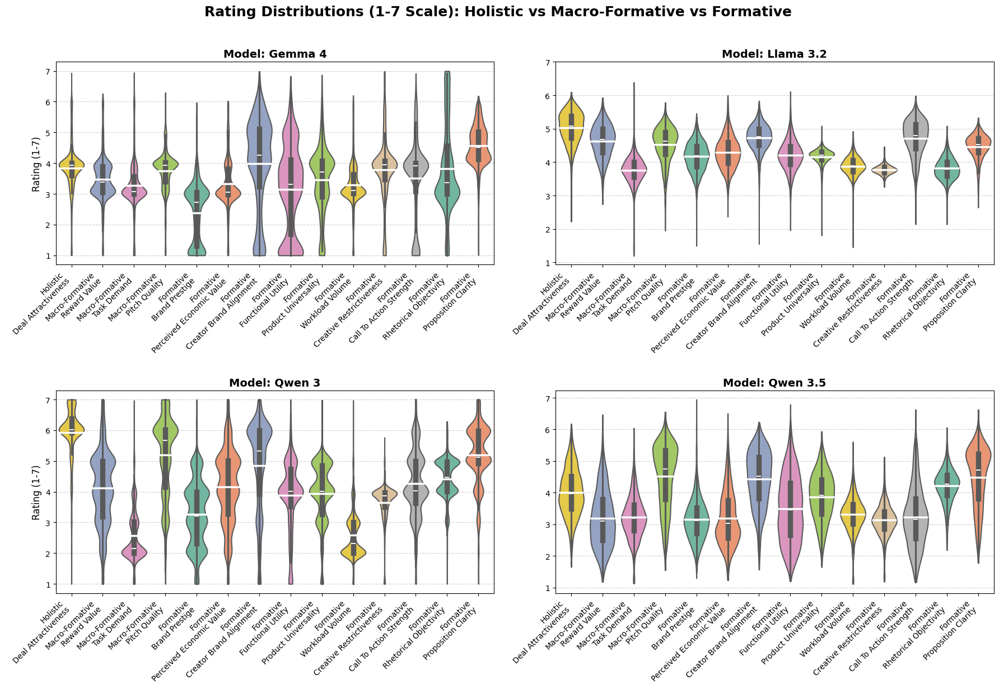

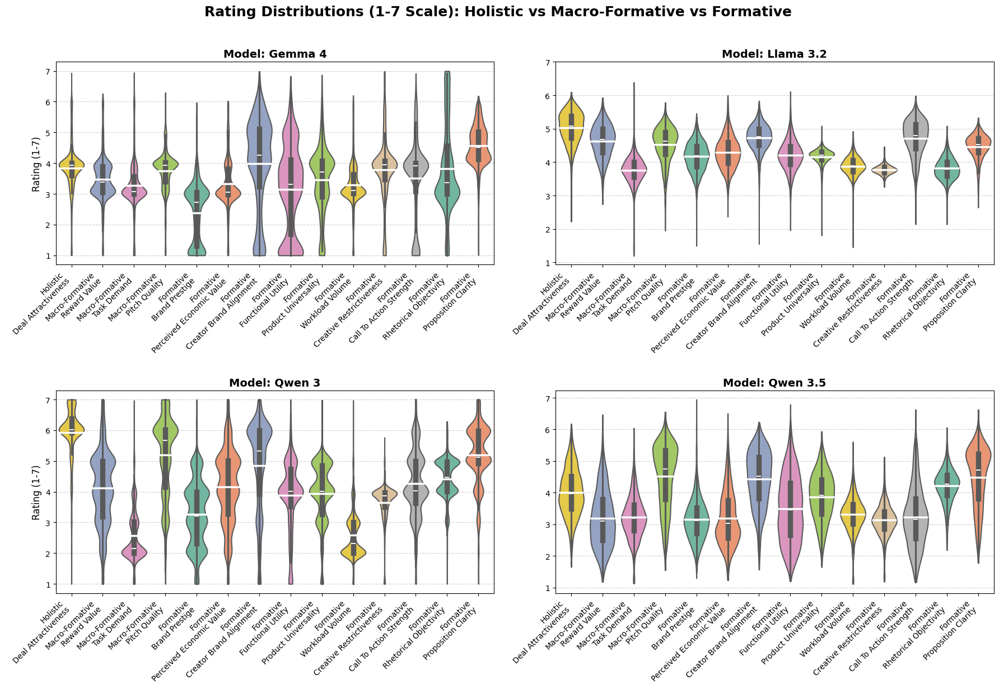

In [25]:
from src.general_analysis.visualisations import plot_rating_distributions_by_architecture

rating_range = (1, 7)
plot_rating_distributions_by_architecture(
    final_df, plot_order=plot_order, dim_map_clean=dim_map_clean, rating_range=rating_range)

## Verbosity bias (relationship between input length and rating)

In [26]:
from src.general_analysis.diagnostics import compute_verbosity_correlations
from src.general_analysis.visualisations import plot_formative_verbosity_breakdown
from src.general_analysis.visualisations import plot_verbosity_breakdown

### Ceiling effect/ effect per textual asset

We observe that there is a curve, characteristic for requirements and body word count. For the Gemma 4 and Qwen 3.5 we see that rating tends to increase until around 150 words, after which it flatlines. This is expected. When a text is very short, words can reliably increase the quality of a text since they add more information ("complex campaigns require sufficient token volume to define rules and reduce ambiguity"). At around 180 words, we see this initial 'verbosity reward' flatline, and even invert in some cases, where longer texts get penalized. This motivates our choice for computing the absolute Cohen's D over the lower and upper quartile. Cohen's D captures the change between two subsets of the data, controlling for the standard deviation. This last part is important, since the differences in how much of the scale each model uses is different. E.g., Llama has a very low standard deviation, and it moves up 0.8 points as word count increases. However, 0.8 is very large when the standard deviation is so low, leading to a large Cohen's D. 

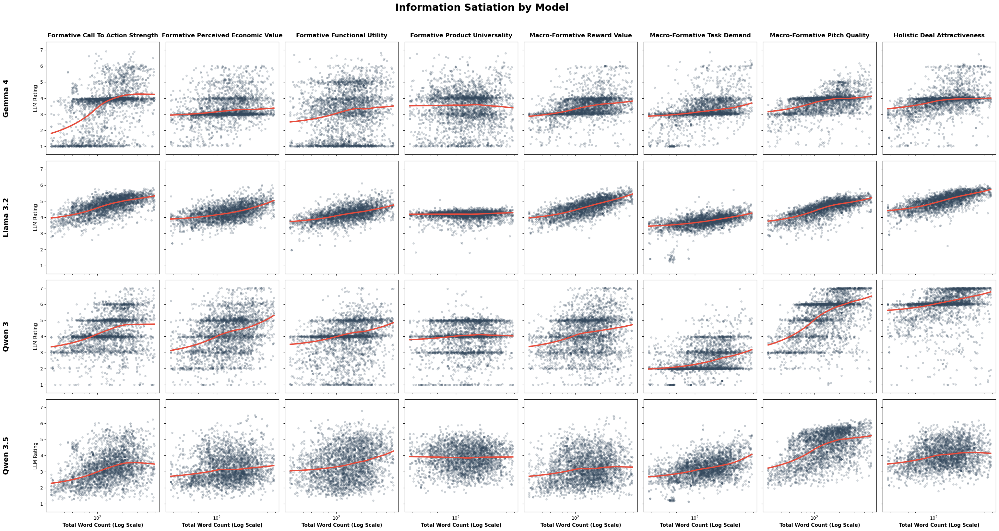

In [27]:
from src.general_analysis.visualisations import plot_verbosity_grid

models = final_df['model_name_clean'].unique()
dimensions = final_df['dimension_name_clean'].unique()[1:5]
dimensions = ['Formative\nCall To Action Strength',
              'Formative\nPerceived Economic Value',
              'Formative\nFunctional Utility',
              'Formative\nProduct Universality',
              'Macro-Formative\nReward Value',
              'Macro-Formative\nTask Demand',
              'Macro-Formative\nPitch Quality',
              'Holistic\nDeal Attractiveness'
              ]
plot_verbosity_grid(final_df, models=models, dimensions=dimensions, model_col='model_name_clean',
                    dim_col='dimension_name_clean',
                    x_col='raw_input_word_count',
                    y_col='mean_rating')

C:\Users\Wouter Barter\Documents\AI_thesis\src\general_analysis\visualisations.py:334: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(data=res_df, x='Text Section', y='Absolute Cohen\'s d', hue='Model',


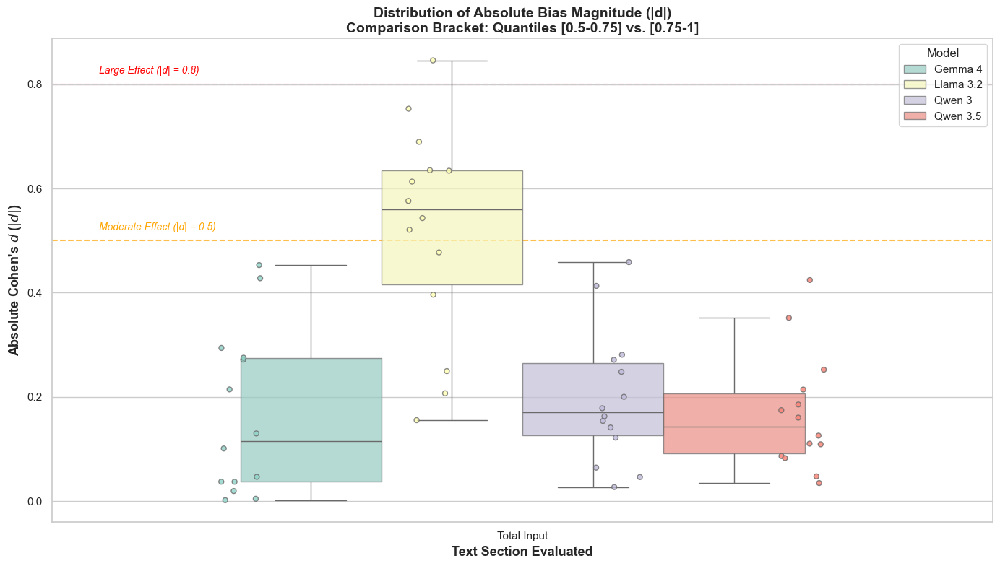

In [28]:
from src.general_analysis.visualisations import plot_absolute_bias_spread

sections = {
    'Total Input': 'raw_input_word_count'}

res_df_upperquart = plot_absolute_bias_spread(final_df, sections, p_lower=[
    0.5, 0.75], p_upper=[0.75, 1])


# sections = {
#     'Total Input': 'raw_input_word_count',
#     'Deal Text (Body)': 'text_word_count',
#     'Requirements': 'requirements_word_count'
# }
# res_df = plot_absolute_bias_spread(final_df, sections, p_lower=[
#                                    0, 0.25], p_upper=[0.75, 1])

Isolating True Verbosity Bias via Mature Text Bracketing
*"In evaluating LLM length heuristics, it is critical to distinguish between 'construct-relevant verbosity' (the necessary resolution of information deficits) and 'heuristic verbosity bias' (the blind rewarding of token volume). Because dimensions such as 'Task Demand' and 'Proposition Clarity' inherently require textual specification, rating increases between short (Q1) and moderate (Q3) texts represent accurate semantic evaluation, not bias.

Therefore, to measure true construct-irrelevant verbosity bias, we isolated our final effect size calculations to the mature text bracket (Q3 vs. Q4). By evaluating texts that have already structurally satisfied the rubric, we test whether the model correctly flatlines its evaluation, or whether a residual length heuristic remains active."*

### Distribution

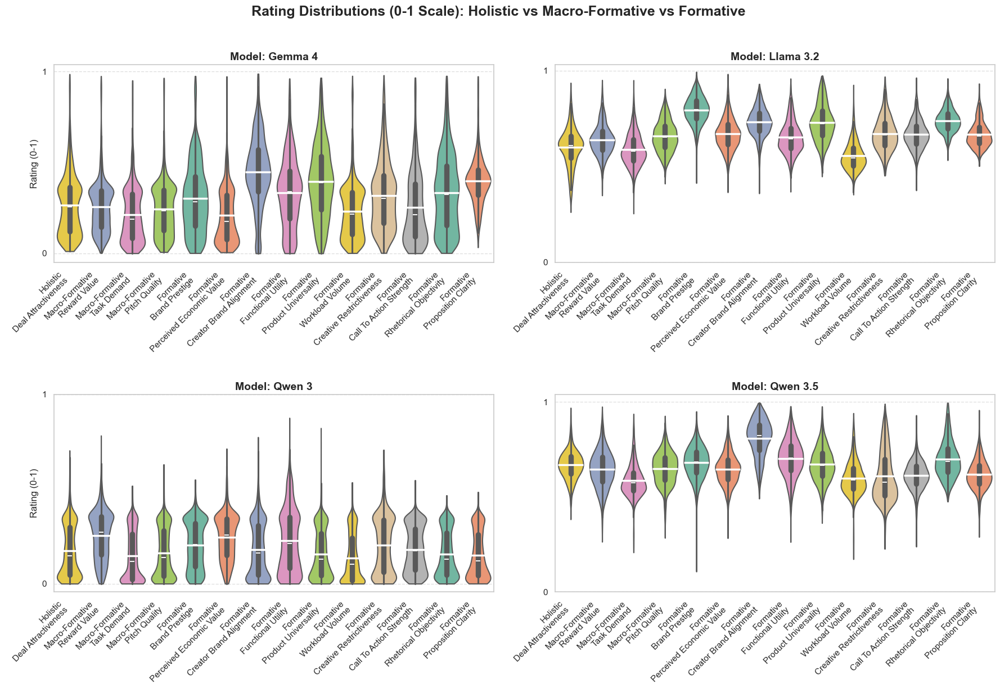

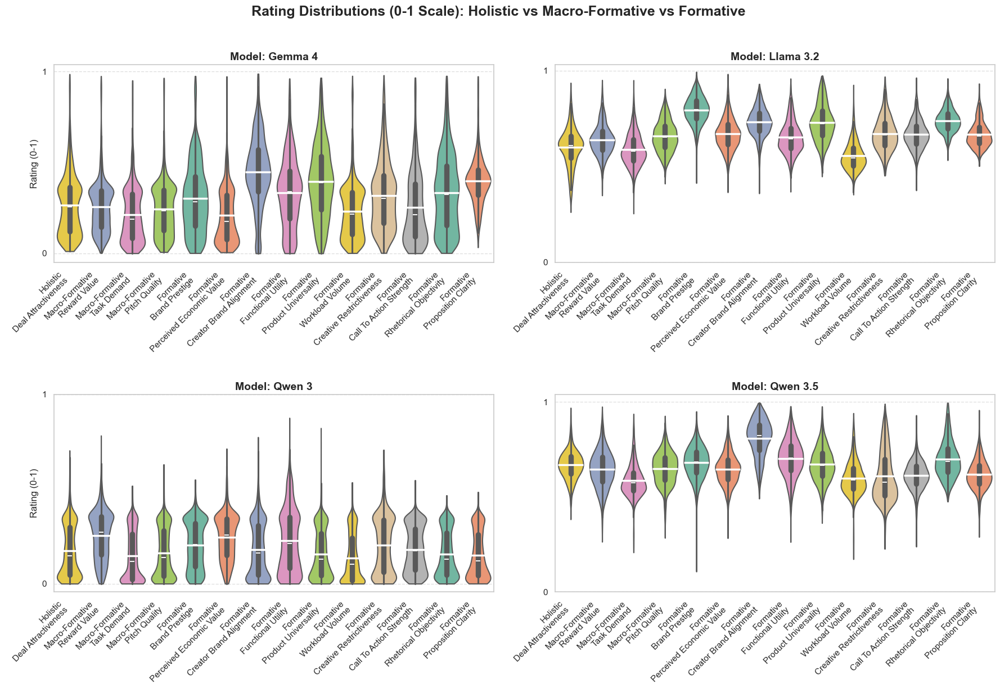

In [29]:
from src.general_analysis.visualisations import plot_rating_distributions_by_architecture

rating_range = (0, 1)
plot_rating_distributions_by_architecture(
    final_df, plot_order=plot_order, score_col='normalized_entropy', rating_range=(0, 1), dim_map_clean=dim_map_clean)

In [30]:
import pandas as pd
import numpy as np
import scipy.stats as stats


def compute_dimension_validity(
    df: pd.DataFrame,
    value_col: str = 'mean_rating',
    target_col: str = 'apps_after_7_days'
) -> pd.DataFrame:
    """
    Computes isolated Spearman rank correlations between individual psychometric 
    dimensions and the behavioral KPI across all model-prompt specifications.
    """
    results = []
    grouped = df.groupby(['model_name', 'prompt_name', 'dimension_name'])

    for (model, prompt, dim), group in grouped:
        # Enforce strict pairwise deletion for valid correlation bounds
        valid_data = group.dropna(subset=[value_col, target_col])

        if len(valid_data) > 1:
            rho, p_val = stats.spearmanr(
                valid_data[value_col], valid_data[target_col])
            n_obs = len(valid_data)
        else:
            rho, p_val, n_obs = np.nan, np.nan, 0

        results.append({
            'model_name': model,
            'prompt_name': prompt,
            'dimension_name': dim,
            'spearman_rho': rho,
            'p_value': p_val,
            'n_obs': n_obs
        })

    return pd.DataFrame(results).sort_values(by='spearman_rho', ascending=False).reset_index(drop=True)


# Execution
dimension_validity_df = compute_dimension_validity(final_df)
print(dimension_validity_df.head(15))

                          model_name      prompt_name  \
0                    Qwen/Qwen3.5-4B        Formative   
1        Qwen/Qwen3-4B-Instruct-2507        Formative   
2              google/gemma-4-E2B-it        Formative   
3                    Qwen/Qwen3.5-4B        Formative   
4        Qwen/Qwen3-4B-Instruct-2507        Formative   
5        Qwen/Qwen3-4B-Instruct-2507  Macro-Formative   
6              google/gemma-4-E2B-it        Formative   
7   meta-llama/Llama-3.2-3B-Instruct        Formative   
8                    Qwen/Qwen3.5-4B        Formative   
9                    Qwen/Qwen3.5-4B   Holistic Naive   
10       Qwen/Qwen3-4B-Instruct-2507        Formative   
11       Qwen/Qwen3-4B-Instruct-2507   Holistic Naive   
12             google/gemma-4-E2B-it        Formative   
13                   Qwen/Qwen3.5-4B        Formative   
14                   Qwen/Qwen3.5-4B  Macro-Formative   

                            dimension_name  spearman_rho       p_value  n_obs  
0      

# Main Analysis: Regression

In [31]:
CONTENT_TYPE_COL = 'macro_category'
CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
                'year_month', 'platform_strategy', 'requirements_length_bucket', 'body_length_bucket']

CONTINUOUS = ['competitor_density']
BINARIES = ['strict_follower_requirement']

EXPERIMENTAL_GROUPS = ['model_name_clean', 'prompt_name']

## Mean

In [32]:
runner_mean = create_regression_runner(
    target_col='apps_after_7_days',  # Log-transformed target
    # target_col='log_apps_after_7_days',  # Log-transformed target
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col='partner_id',
    model_type='negbin',
)

runner_mean.run_baseline_model(
    df=og_df,
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    label="baseline"
)

predictor_names = ['z_mean_rating']

runner_mean.run_regression(df=final_df,
                           cat_vars=CATEGORICALS,
                           bin_vars=BINARIES,
                           num_vars=CONTINUOUS,
                           predictor_names=predictor_names)

✓ Baseline model fitted: 2960 observations, AIC=21056.41


In [ ]:
from src.general_analysis.diagnostics import collect_all_diagnostics, overview

runner_mean_summ = runner_mean.summarize().copy()

interactive_regression_results_selector(runner_mean.results)

Dropdown(description='Select option:', index=1, layout=Layout(width='400px'), options=('baseline', 'Gemma 4 Fo…

<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:      apps_after_7_days   No. Observations:                 2960
Model:               NegativeBinomial   Df Residuals:                     2912
Method:                           MLE   Df Model:                           47
Date:                Fri, 03 Jul 2026   Pseudo R-squ.:                 0.07446
Time:                        16:03:35   Log-Likelihood:                -10282.
converged:                       True   LL-Null:                       -11109.
Covariance Type:              cluster   LLR p-value:                     0.000
=====================================================================================================================
                                                        coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------------
const                                                 2.5934      0.193     13.462      0.000       2.215       2.971
deal_pitch_brand_prestige_z_mean_rating               0.0767      0.027      2.848      0.004       0.024       0.130
deal_pitch_call_to_action_strength_z_mean_rating      0.0401      0.032      1.241      0.215      -0.023       0.104
deal_pitch_creative_restrictiveness_z_mean_rating    -0.0191      0.027     -0.717      0.474      -0.071       0.033
deal_pitch_creator_brand_alignment_z_mean_rating      0.0376      0.032      1.187      0.235      -0.025       0.100
deal_pitch_functional_utility_z_mean_rating          -0.1424      0.029     -4.945      0.000      -0.199      -0.086
deal_pitch_perceived_economic_value_z_mean_rating     0.1711      0.028      6.079      0.000       0.116       0.226
deal_pitch_product_universality_z_mean_rating         0.3384      0.032     10.486      0.000       0.275       0.402
deal_pitch_proposition_clarity_z_mean_rating         -0.0198      0.026     -0.774      0.439      -0.070       0.030
deal_pitch_rhetorical_objectivity_z_mean_rating      -0.0278      0.030     -0.927      0.354      -0.087       0.031
deal_pitch_workload_volume_z_mean_rating             -0.0110      0.030     -0.373      0.709      -0.069       0.047
strict_follower_requirement                          -0.2049      0.056     -3.646      0.000      -0.315      -0.095
competitor_density                                   -0.0390      0.008     -5.168      0.000      -0.054      -0.024
market_scope_Tier1_NonNLD_international              -1.3009      0.192     -6.763      0.000      -1.678      -0.923
market_scope_Tier2_NLD_only                          -0.3403      0.063     -5.429      0.000      -0.463      -0.217
market_scope_Tier3_BEL_Only                          -1.2114      0.153     -7.940      0.000      -1.511      -0.912
market_scope_Tier4_Germany                           -1.7555      0.077    -22.924      0.000      -1.906      -1.605
market_scope_Tier5_Other                             -1.4341      0.144     -9.946      0.000      -1.717      -1.151
macro_category_Beauty                                 0.5672      0.169      3.366      0.001       0.237       0.898
macro_category_Digital Entertainment                  0.0370      0.172      0.214      0.830      -0.301       0.375
macro_category_Dining & Hospitality                   0.1080      0.179      0.605      0.545      -0.242       0.458
macro_category_Family & Parenting                     0.0048      0.191      0.025      0.980      -0.370       0.380
macro_category_Fashion                                0.3781      0.181      2.087      0.037       0.023       0.734
macro_category_Home Cooking & CPG                     0.2814      0.169      1.665      0.096      -0.050       0.613
macro_category_In-Person Experiences                 -0

In [34]:
# same API as FeedbackQA runner
runner_mean_summ = runner_mean.summarize().copy()

runner_mean_summ

,model_name_clean,prompt_name,label,nobs,r_squared,adj_r_squared,pseudo_r_squared,aic,bic,llf,condition_number,mse,mae,pearson_r,spearman_rho,kendall_tau
10,Qwen 3.5,Formative,Qwen 3.5 Formative,2960,NaN,NaN,0.075278,20644.100860,20937.755143,-10273.050430,NaN,326.188368,10.624192,0.521872,0.637756,0.462468
1,Gemma 4,Formative,Gemma 4 Formative,2960,NaN,NaN,0.074461,20662.256387,20955.910669,-10282.128193,NaN,331.608345,10.707070,0.510475,0.634311,0.460098
7,Qwen 3,Formative,Qwen 3 Formative,2960,NaN,NaN,0.071760,20722.267302,21015.921585,-10312.133651,NaN,329.743108,10.720511,0.512808,0.631668,0.457137
4,Llama 3.2,Formative,Llama 3.2 Formative,2960,NaN,NaN,0.066509,20838.936248,21132.590531,-10370.468124,NaN,340.487888,10.915302,0.490147,0.612381,0.441054
9,Qwen 3,Macro-Formative,Qwen 3 Macro-Formative,2960,NaN,NaN,0.061650,20932.895642,21184.599313,-10424.447821,NaN,351.094581,11.178584,0.465055,0.592919,0.424302
8,Qwen 3,Holistic Naive,Qwen 3 Holistic Naive,2960,NaN,NaN,0.059694,20972.356936,21212.074718,-10446.178468,NaN,351.583029,11.198505,0.462819,0.586819,0.419512
11,Qwen 3.5,Holistic Naive,Qwen 3.5 Holistic Naive,2960,NaN,NaN,0.058930,20989.328384,21229.046165,-10454.664192,NaN,350.831707,11.206557,0.464561,0.583632,0.416906
12,Qwen 3.5,Macro-Formative,Qwen 3.5 Macro-Formative,2960,NaN,NaN,0.058851,20995.088369,21246.792040,-10455.544185,NaN,348.255218,11.162792,0.470421,0.583326,0.417202
6,Llama 3.2,Macro-Formative,Llama 3.2 Macro-Formative,2960,NaN,NaN,0.057934,21015.455019,21267.158690,-10465.727509,NaN,349.977491,11.202585,0.466542,0.580192,0.414792
2,Gemma 4,Holistic Naive,Gemma 4 Holistic Naive,2960,NaN,NaN,0.057658,21017.595780,21257.313562,-10468.797890,NaN,354.724187,11.289688,0.455262,0.578136,0.412189


### Extract results for the appendix

In [35]:
import re
import numpy as np
import pandas as pd


def _as_series(x, index):
    """Convert statsmodels arrays/Series to a pandas Series with the right index."""
    if isinstance(x, pd.Series):
        return x
    return pd.Series(np.asarray(x), index=index)


def significance_stars(p):
    if pd.isna(p):
        return ""
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    if p < 0.10:
        return "†"
    return ""


def extract_nb_results(
    result,
    model_name=None,
    include_regex=None,
    exclude_regex=None,
    drop_intercept=True,
    drop_alpha=True,
    round_digits=3,
):
    """
    Extract coefficients and model metrics from a statsmodels NegativeBinomialResultsWrapper.

    Parameters
    ----------
    result:
        statsmodels NegativeBinomialResultsWrapper.
    model_name:
        Optional model label, e.g. "Qwen 3.5 Formative".
    include_regex:
        Optional regex. Only predictors matching this pattern are retained.
        Useful for selecting only LLM criterion predictors.
    exclude_regex:
        Optional regex. Predictors matching this pattern are removed.
        Useful for excluding controls, fixed effects, or dummies.
    drop_intercept:
        Whether to remove intercept/constant terms.
    drop_alpha:
        Whether to remove the NB dispersion parameter alpha from the coefficient table.
    round_digits:
        Number of decimals for rounded display columns.

    Returns
    -------
    coef_df:
        DataFrame with beta, SE, z, p, IRR, confidence intervals, and formatted columns.
    metrics:
        Series with nobs, log-likelihood, AIC, BIC, pseudo-R2, alpha, etc.
    """

    # --- coefficients ---
    params = result.params
    if not isinstance(params, pd.Series):
        names = getattr(result.model, "exog_names", None)
        if names is None:
            names = [f"x{i}" for i in range(len(params))]
        params = pd.Series(np.asarray(params), index=names)

    idx = params.index
    bse = _as_series(result.bse, idx)
    pvalues = _as_series(result.pvalues, idx)

    # z-values are usually available, but compute them if needed
    try:
        zvalues = _as_series(result.tvalues, idx)
    except Exception:
        zvalues = params / bse

    conf = result.conf_int()
    if isinstance(conf, np.ndarray):
        conf = pd.DataFrame(conf, index=idx, columns=["ci_low", "ci_high"])
    else:
        conf = conf.copy()
        conf.columns = ["ci_low", "ci_high"]

    coef_df = pd.DataFrame({
        "model": model_name,
        "predictor": idx,
        "beta": params.values,
        "se": bse.values,
        "z": zvalues.values,
        "p": pvalues.values,
        "ci_low": conf["ci_low"].values,
        "ci_high": conf["ci_high"].values,
    })

    # Drop intercept / alpha if requested
    if drop_intercept:
        coef_df = coef_df[~coef_df["predictor"].str.lower().isin(
            ["const", "intercept"]
        )]

    if drop_alpha:
        coef_df = coef_df[coef_df["predictor"].str.lower() != "alpha"]

    # Include / exclude filters
    if include_regex is not None:
        coef_df = coef_df[coef_df["predictor"].str.contains(
            include_regex, regex=True, case=False, na=False
        )]

    if exclude_regex is not None:
        coef_df = coef_df[~coef_df["predictor"].str.contains(
            exclude_regex, regex=True, case=False, na=False
        )]

    # IRR and CI on multiplicative scale
    coef_df["irr"] = np.exp(coef_df["beta"])
    coef_df["irr_ci_low"] = np.exp(coef_df["ci_low"])
    coef_df["irr_ci_high"] = np.exp(coef_df["ci_high"])
    coef_df["stars"] = coef_df["p"].apply(significance_stars)

    # Formatted columns for LaTeX/reporting
    r = round_digits
    coef_df["beta_se"] = (
        coef_df["beta"].round(r).astype(str)
        + coef_df["stars"]
        + " ("
        + coef_df["se"].round(r).astype(str)
        + ")"
    )
    coef_df["irr_fmt"] = coef_df["irr"].round(r).astype(str)
    coef_df["p_fmt"] = coef_df["p"].map(lambda x: f"{x:.3f}")

    # --- model metrics ---
    llf = getattr(result, "llf", np.nan)
    llnull = getattr(result, "llnull", np.nan)

    if hasattr(result, "prsquared"):
        pseudo_r2 = result.prsquared
    elif np.isfinite(llf) and np.isfinite(llnull) and llnull != 0:
        pseudo_r2 = 1 - (llf / llnull)
    else:
        pseudo_r2 = np.nan

    # NB alpha is sometimes in params
    alpha = np.nan
    for name in params.index:
        if str(name).lower() == "alpha":
            alpha = params.loc[name]
            break

    metrics = pd.Series({
        "model": model_name,
        "nobs": getattr(result, "nobs", np.nan),
        "df_model": getattr(result, "df_model", np.nan),
        "df_resid": getattr(result, "df_resid", np.nan),
        "llf": llf,
        "llnull": llnull,
        "pseudo_r2": pseudo_r2,
        "aic": getattr(result, "aic", np.nan),
        "bic": getattr(result, "bic", np.nan),
        "alpha": alpha,
    })

    return coef_df.reset_index(drop=True), metrics


def latex_escape(s):
    """Escape LaTeX special characters in labels."""
    replacements = {
        "&": r"\&",
        "%": r"\%",
        "$": r"\$",
        "#": r"\#",
        "_": r"\_",
        "{": r"\{",
        "}": r"\}",
    }
    for old, new in replacements.items():
        s = s.replace(old, new)
    return s


def extract_multiple_nb_results(
    results_dict,
    model_names,
    include_regex=None,
    exclude_regex=None,
    drop_intercept=True,
    drop_alpha=True,
    round_digits=3,
):
    """
    Extract coefficients and metrics for several named models from a results dictionary.
    """
    coef_tables = []
    metric_rows = []

    for name in model_names:
        coef_df, metrics = extract_nb_results(
            results_dict[name],
            model_name=name,
            include_regex=include_regex,
            exclude_regex=exclude_regex,
            drop_intercept=drop_intercept,
            drop_alpha=drop_alpha,
            round_digits=round_digits,
        )
        coef_tables.append(coef_df)
        metric_rows.append(metrics)

    all_coefs = pd.concat(coef_tables, ignore_index=True)
    all_metrics = pd.DataFrame(metric_rows)

    return all_coefs, all_metrics


def clean_baseline_label(var):
    """Human-readable labels for Barter baseline predictors."""

    explicit = {
        "strict_follower_requirement": "Strict follower requirement",
        "competitor_density": "Competitor density",

        "market_scope_Tier1_NonNLD_international": "Market scope: non-Dutch international",
        "market_scope_Tier2_NLD_only": "Market scope: Netherlands only",
        "market_scope_Tier3_BEL_Only": "Market scope: Belgium only",
        "market_scope_Tier4_Germany": "Market scope: Germany",
        "market_scope_Tier5_Other": "Market scope: other",

        "platform_strategy_IG_and_TikTok": "Platform strategy: Instagram and TikTok",
        "platform_strategy_Instagram_Only": "Platform strategy: Instagram only",
        "platform_strategy_TikTok_Only": "Platform strategy: TikTok only",
        "platform_strategy_Unspecified": "Platform strategy: unspecified",

        "requirements_length_bucket_2. Medium-Short": "Requirements length: medium-short",
        "requirements_length_bucket_3. Medium-Long": "Requirements length: medium-long",
        "requirements_length_bucket_4. Long": "Requirements length: long",

        "body_length_bucket_2. Medium-Short": "Body length: medium-short",
        "body_length_bucket_3. Medium-Long": "Body length: medium-long",
        "body_length_bucket_4. Long": "Body length: long",
    }

    if var in explicit:
        return explicit[var]

    if var.startswith("macro_category_"):
        category = var.replace("macro_category_", "")
        return f"Product category: {category}"

    if var.startswith("year_month_"):
        ym = var.replace("year_month_", "")
        return f"Month-year: {ym}"

    return var.replace("_", " ").title()


def baseline_group(var):
    """Group predictors for display order in the LaTeX table."""
    if var in ["strict_follower_requirement", "competitor_density"]:
        return "Deal and market controls"
    if var.startswith("market_scope_"):
        return "Market scope"
    if var.startswith("macro_category_"):
        return "Product category"
    if var.startswith("platform_strategy_"):
        return "Platform strategy"
    if var.startswith("requirements_length_bucket_"):
        return "Requirements length"
    if var.startswith("body_length_bucket_"):
        return "Body length"
    if var.startswith("year_month_"):
        return "Month-year fixed effects"
    return "Other"


def extract_baseline_coefficients(
    result,
    include_const=False,
    include_alpha=False,
    include_year_month=False,
    round_digits=3,
):
    """
    Extract clean baseline coefficients from a statsmodels NegativeBinomial result.

    Returns a DataFrame with beta, SE, p, IRR, and display labels.
    """

    params = result.params
    if not isinstance(params, pd.Series):
        names = getattr(result.model, "exog_names", None)
        params = pd.Series(np.asarray(params), index=names)

    bse = result.bse if isinstance(result.bse, pd.Series) else pd.Series(
        result.bse, index=params.index)
    pvalues = result.pvalues if isinstance(
        result.pvalues, pd.Series) else pd.Series(result.pvalues, index=params.index)

    rows = []
    for var in params.index:
        if var == "const" and not include_const:
            continue
        if var == "alpha" and not include_alpha:
            continue
        if var.startswith("year_month_") and not include_year_month:
            continue

        beta = params[var]
        se = bse[var]
        p = pvalues[var]
        irr = np.exp(beta)

        rows.append({
            "raw_predictor": var,
            "group": baseline_group(var),
            "predictor": clean_baseline_label(var),
            "beta": beta,
            "se": se,
            "p": p,
            "irr": irr,
            "stars": significance_stars(p),
        })

    df = pd.DataFrame(rows)

    group_order = {
        "Deal and market controls": 1,
        "Market scope": 2,
        "Product category": 3,
        "Platform strategy": 4,
        "Requirements length": 5,
        "Body length": 6,
        "Month-year fixed effects": 7,
        "Other": 99,
    }

    df["group_order"] = df["group"].map(group_order).fillna(99)
    df = df.sort_values(["group_order", "raw_predictor"]
                        ).reset_index(drop=True)

    r = round_digits
    df["beta_fmt"] = df.apply(
        lambda x: f"${x['beta']:.{r}f}{x['stars']}$",
        axis=1
    )
    df["se_fmt"] = df["se"].map(lambda x: f"$({x:.{r}f})$")
    df["irr_fmt"] = df["irr"].map(lambda x: f"{x:.{r}f}")
    df["p_fmt"] = df["p"].map(lambda x: f"{x:.3f}")

    return df


def baseline_coefficients_to_latex(
    df,
    caption="Structural Baseline Coefficient Estimates for Barter Deals",
    label="tab:barter_baseline_coefficients",
    include_group_headers=True,
):
    """
    Produce a clean booktabs LaTeX table with coefficient rows and SE rows.
    """

    lines = []
    lines.append(r"\begin{table}[htbp]")
    lines.append(r"\centering")
    lines.append(r"\small")
    lines.append(rf"\caption{{{caption}}}")
    lines.append(rf"\label{{{label}}}")
    lines.append(r"\begin{tabular}{lcc}")
    lines.append(r"\toprule")
    lines.append(r"Predictor & $\beta$ & IRR \\")
    lines.append(r"\midrule")

    current_group = None

    for _, row in df.iterrows():
        group = row["group"]

        if include_group_headers and group != current_group:
            if current_group is not None:
                lines.append(r"\addlinespace[0.35em]")
            lines.append(
                rf"\multicolumn{{3}}{{l}}{{\textit{{{latex_escape(group)}}}}} \\")
            current_group = group

        predictor = latex_escape(row["predictor"])
        lines.append(rf"{predictor} & {row['beta_fmt']} & {row['irr_fmt']} \\")
        lines.append(rf" & {row['se_fmt']} &  \\")

    lines.append(r"\bottomrule")
    lines.append(r"\end{tabular}")
    lines.append("")
    lines.append(r"\begin{flushleft}")
    lines.append(r"\footnotesize")
    lines.append(
        r"\textit{Note.} Coefficients are from the structural baseline Negative Binomial regression with log link. "
        r"The model includes only non-LLM platform covariates and month-year fixed effects. "
        r"Month-year fixed effects are included but omitted from the table. "
        r"IRR denotes the incidence-rate ratio, $\exp(\beta)$, which expresses the coefficient on the expected-count scale: "
        r"values above 1 indicate higher expected application counts, while values below 1 indicate lower expected application counts, conditional on the other controls. "
        r"Standard errors, reported in parentheses, are clustered at the partner level. "
        r"Significance levels: $^{\dagger}p < .10$, $^{*}p < .05$, $^{**}p < .01$, $^{***}p < .001$."
    )
    lines.append(r"\end{flushleft}")
    lines.append(r"\end{table}")

    return "\n".join(lines)

In [36]:
baseline_res = runner_mean.results["baseline"]

baseline_df = extract_baseline_coefficients(
    baseline_res,
    include_const=False,
    include_alpha=False,
    include_year_month=False,
    round_digits=3,
)

latex_table = baseline_coefficients_to_latex(baseline_df)

print(latex_table)

\begin{table}[htbp]
\centering
\small
\caption{Structural Baseline Coefficient Estimates for Barter Deals}
\label{tab:barter_baseline_coefficients}
\begin{tabular}{lcc}
\toprule
Predictor & $\beta$ & IRR \\
\midrule
\multicolumn{3}{l}{\textit{Deal and market controls}} \\
Competitor density & $-0.042***$ & 0.959 \\
 & $(0.008)$ &  \\
Strict follower requirement & $-0.172**$ & 0.842 \\
 & $(0.060)$ &  \\
\addlinespace[0.35em]
\multicolumn{3}{l}{\textit{Market scope}} \\
Market scope: non-Dutch international & $-1.325***$ & 0.266 \\
 & $(0.245)$ &  \\
Market scope: Netherlands only & $-0.392***$ & 0.676 \\
 & $(0.066)$ &  \\
Market scope: Belgium only & $-1.295***$ & 0.274 \\
 & $(0.185)$ &  \\
Market scope: Germany & $-1.810***$ & 0.164 \\
 & $(0.084)$ &  \\
Market scope: other & $-1.434***$ & 0.238 \\
 & $(0.156)$ &  \\
\addlinespace[0.35em]
\multicolumn{3}{l}{\textit{Product category}} \\
Product category: Beauty & $0.602**$ & 1.826 \\
 & $(0.191)$ &  \\
Product category: Digital Ente

In [37]:
models = ["Gemma 4 Formative", "Qwen 3.5 Formative"]

coefs, metrics = extract_multiple_nb_results(
    runner_mean.results,
    model_names=models,
    include_regex=('deal_pitch')
)

coefs_subset = coefs[[
    "model", "predictor", "beta", "se", "p", "irr", "beta_se", "irr_fmt"
]]

coefs

,model,predictor,beta,se,z,p,ci_low,ci_high,irr,irr_ci_low,irr_ci_high,stars,beta_se,irr_fmt,p_fmt
0,Gemma 4 Formative,deal_pitch_brand_prestige_z_mean_rating,0.076725,0.026937,2.848314,4.473015e-03,0.023874,0.129576,1.079745,1.024162,1.138346,**,0.077** (0.027),1.08,0.004
1,Gemma 4 Formative,deal_pitch_call_to_action_strength_z_mean_rating,0.040140,0.032334,1.241408,2.147068e-01,-0.023301,0.103581,1.040957,0.976969,1.109136,,0.04 (0.032),1.041,0.215
2,Gemma 4 Formative,deal_pitch_creative_restrictiveness_z_mean_rating,-0.019101,0.026650,-0.716735,4.736823e-01,-0.071389,0.033187,0.981080,0.931100,1.033744,,-0.019 (0.027),0.981,0.474
3,Gemma 4 Formative,deal_pitch_creator_brand_alignment_z_mean_rating,0.037580,0.031648,1.187429,2.353026e-01,-0.024514,0.099674,1.038295,0.975784,1.104810,,0.038 (0.032),1.038,0.235
4,Gemma 4 Formative,deal_pitch_functional_utility_z_mean_rating,-0.142369,0.028788,-4.945441,8.720214e-07,-0.198852,-0.085887,0.867301,0.819671,0.917698,***,-0.142*** (0.029),0.867,0.000
5,Gemma 4 Formative,deal_pitch_perceived_economic_value_z_mean_rating,0.171118,0.028150,6.078765,1.642534e-09,0.115887,0.226349,1.186631,1.122869,1.254014,***,0.171*** (0.028),1.187,0.000
6,Gemma 4 Formative,deal_pitch_product_universality_z_mean_rating,0.338374,0.032269,10.485960,1.227180e-24,0.275061,0.401687,1.402665,1.316611,1.494343,***,0.338*** (0.032),1.403,0.000
7,Gemma 4 Formative,deal_pitch_proposition_clarity_z_mean_rating,-0.019843,0.025643,-0.773824,4.391932e-01,-0.070155,0.030469,0.980352,0.932249,1.030938,,-0.02 (0.026),0.98,0.439
8,Gemma 4 Formative,deal_pitch_rhetorical_objectivity_z_mean_rating,-0.027762,0.029956,-0.926770,3.542394e-01,-0.086537,0.031012,0.972619,0.917102,1.031498,,-0.028 (0.03),0.973,0.354
9,Gemma 4 Formative,deal_pitch_workload_volume_z_mean_rating,-0.011047,0.029627,-0.372867,7.093158e-01,-0.069175,0.047081,0.989014,0.933163,1.048207,,-0.011 (0.03),0.989,0.709


In [38]:
appendix_table = (
    coefs_subset
    .pivot(index="predictor", columns="model", values=["beta_se", "irr_fmt"])
)

print(
    appendix_table.to_latex(
        index=True,
        escape=False,
        caption="Fine-Grained Formative Coefficient Estimates for Selected Barter Deals Specifications",
        label="tab:barter_coefficients_selected"
    )
)

\begin{table}
\caption{Fine-Grained Formative Coefficient Estimates for Selected Barter Deals Specifications}
\label{tab:barter_coefficients_selected}
\begin{tabular}{lllll}
\toprule
 & \multicolumn{2}{r}{beta_se} & \multicolumn{2}{r}{irr_fmt} \\
model & Gemma 4 Formative & Qwen 3.5 Formative & Gemma 4 Formative & Qwen 3.5 Formative \\
predictor &  &  &  &  \\
\midrule
deal_pitch_brand_prestige_z_mean_rating & 0.077** (0.027) & 0.0 (0.029) & 1.08 & 1.0 \\
deal_pitch_call_to_action_strength_z_mean_rating & 0.04 (0.032) & 0.051 (0.034) & 1.041 & 1.052 \\
deal_pitch_creative_restrictiveness_z_mean_rating & -0.019 (0.027) & -0.039 (0.031) & 0.981 & 0.962 \\
deal_pitch_creator_brand_alignment_z_mean_rating & 0.038 (0.032) & 0.03 (0.034) & 1.038 & 1.03 \\
deal_pitch_functional_utility_z_mean_rating & -0.142*** (0.029) & -0.064* (0.031) & 0.867 & 0.938 \\
deal_pitch_perceived_economic_value_z_mean_rating & 0.171*** (0.028) & 0.155*** (0.029) & 1.187 & 1.167 \\
deal_pitch_product_universality_

# Cross-validation

In [39]:
from src.barter.regression_validation import PredictiveValidityExplorer
from src.utils import interactive_dataframe_selector

explorer = PredictiveValidityExplorer(runner_mean)

In [52]:
og_df

,applicants_applications_count,content_types,deal_id,main_image,min_social_media_followers,deal_tags,live_since,first_application_at,last_application_at,company_locations,...,log_competitor_density,time_to_update_hours,was_updated,update_window,exposure_hours,log_raw_input_word_count,raw_input_word_count_squared,length_bucket,requirements_length_bucket,body_length_bucket
0,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,0.000000,781.205108,True,after_7d,168.000000,3.988984,2809,1. Short,1. Short,1. Short
1,8,"[{'id': 41, 'name': 'Activities', 'slug': 'per...",01968af1-f78d-00c8-d1f0-b6ea4e7f3251,uploads/deals/01968af0-f987-ffff-16c0-e833ccff...,2500,None,2025-05-01 08:23:55.697617,2025-05-01 12:16:14.626582,2025-05-04 19:08:46.280439,"[{""id"": ""01KERJ26D105FM72RARYSMA2AW"", ""name"": ...",...,1.609438,6143.256295,True,after_7d,168.000000,4.234107,4624,1. Short,2. Medium-Short,1. Short
2,21,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'...",01968b03-f7b6-00c8-4ac5-f92b235aa10d,uploads/deals/01968aff-9f67-ffff-dea2-0def50c9...,10000,None,2025-05-01 08:43:35.350826,2025-05-01 10:54:50.019465,2025-11-19 22:40:24.416572,"[{""id"": ""01KERHSGS605FV5KNYGEBG6FME"", ""name"": ...",...,1.386294,6142.928616,True,after_7d,168.000000,4.574711,9216,2. Medium-Short,2. Medium-Short,1. Short
3,21,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'...",01968b0b-b879-00c8-470e-044f1e26e293,uploads/deals/01968b0b-62d6-ffff-2af8-f62cb203...,5000,None,2025-05-01 08:52:03.597239,2025-05-01 17:24:20.747332,2025-12-01 09:35:34.914363,"[{""id"": ""01KERHSGS605FV5KNYGEBG6FME"", ""name"": ...",...,1.386294,6142.787490,True,after_7d,168.000000,4.219508,4489,1. Short,1. Short,1. Short
4,10,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'...",01968b1a-621a-00c8-eb2a-36b7f3ee8694,uploads/deals/01968b19-9ced-ffff-b45c-85efb252...,5000,None,2025-05-01 09:08:04.376892,2025-05-01 10:18:05.456020,2025-11-19 22:36:57.476841,None,...,1.386294,5140.924606,True,after_7d,168.000000,4.934474,19044,3. Medium-Long,2. Medium-Short,3. Medium-Long
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3419,37,"[{'id': 39, 'name': 'Experiences', 'slug': 'Te...",019cd2c5-58c5-00c8-7191-1b4d225c997d,uploads/deals/019cd2c3-eb0b-ffff-f986-e5f5e04a...,10000,None,2026-03-09 13:24:34.783518,2026-03-09 13:31:45.295401,2026-03-23 10:42:09.855831,None,...,1.609438,335.950329,True,after_7d,168.000000,5.693732,87616,4. Long,4. Long,3. Medium-Long
3420,309,"[{'id': 39, 'name': 'Experiences', 'slug': 'Te...",019cd2f6-0b38-00c8-8632-d21f82239d99,uploads/deals/019cd2f4-ea18-ffff-22cf-7f051c10...,2500,None,2026-03-09 14:17:46.161271,2026-03-09 14:20:45.600022,2026-03-23 23:28:29.743306,None,...,1.609438,0.000033,False,no_or_instant_update,1.000000,5.843544,118336,4. Long,2. Medium-Short,4. Long
3421,60,"[{'id': 41, 'name': 'Activities', 'slug': 'per...",019cd345-8059-00c8-4f76-2022ec342341,uploads/deals/019cd344-fbc3-ffff-a966-1937e0f6...,2500,None,2026-03-09 16:05:33.903411,2026-03-09 16:15:45.752355,2026-03-23 21:20:47.153978,None,...,0.000000,0.350149,True,within_1h,1.000000,5.303305,40000,3. Medium-Long,3. Medium-Long,4. Long
3422,2,"[{'id': 29, 'name': 'UGC', 'slug': 'Film-Strip...",019cd3d5-cb91-00c8-8ba0-4dc62e4c938e,uploads/deals/019cd3d3-5df8-ffff-d3fd-6aeeda86...,2500,None,2026-03-09 18:29:41.700566,2026-03-12 06:35:48.124634,2026-03-16 22:29:27.224174,None,...,0.000000,177.630752,True,after_7d,168.000000,5.141664,28900,3. Medium-Long,4. Long,2. Medium-Short


In [ ]:
from src.barter.cross_validation import cross_validate_barter_models

model_configs = {
    'Baseline': None,
    'Z-Mean Only': ['z_mean_rating'],
    # 'Z-Mode Only': ['z_mode_rating']
    # 'Z-Mean + Entropy': ['z_mean_rating', 'normalized_entropy']
}

cv_results_df = cross_validate_barter_models(
    df=final_df,  # Use your combined dataframe
    target_col='apps_after_7_days',
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col='partner_id',
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    model_configs=model_configs,
    n_splits=5
)

# Sort to easily see if Entropy improves the out-of-sample error
# print(cv_results_df.sort_values(['Experiment Group', 'RMSE (Mean)']))


--- Cross-validating group: ('Gemma 4', 'Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mode Only CV complete.

--- Cross-validating group: ('Gemma 4', 'Holistic Naive') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mode Only CV complete.

--- Cross-validating group: ('Gemma 4', 'Macro-Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mode Only CV complete.

--- Cross-validating group: ('Llama 3.2', 'Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mode Only CV complete.

--- Cross-validating group: ('Llama 3.2', 'Holistic Naive') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mode Only CV complete.

--- Cross-validating group: ('Llama 3.2', 'Macro-Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mode Only CV complete.

--- Cross-validating group: ('Qwen 3', 'Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mode Only CV complete.

--- Cross-validating

In [ ]:
cv_results_df

,Experiment Group,Model,RMSE (Mean),MAE (Mean),Poisson Dev (Mean),Pearson r (Mean),Spearman Rho (Mean),Kendall Tau (Mean)
0,Gemma 4 | Formative,Baseline,19.476527,11.703938,14.681921,0.392582,0.532587,0.377814
1,Gemma 4 | Formative,Z-Mean Only,18.881054,11.126928,13.228677,0.456139,0.600009,0.432289
2,Gemma 4 | Formative,Z-Mode Only,18.980293,11.202586,13.499021,0.447437,0.593199,0.425258
3,Gemma 4 | Holistic Naive,Baseline,19.476562,11.703979,14.681985,0.392579,0.532578,0.377807
4,Gemma 4 | Holistic Naive,Z-Mean Only,19.470593,11.717246,14.599296,0.396125,0.538809,0.381246
5,Gemma 4 | Holistic Naive,Z-Mode Only,19.435103,11.708709,14.576880,0.397905,0.536962,0.380088
6,Gemma 4 | Macro-Formative,Baseline,19.476523,11.703946,14.681928,0.392582,0.532580,0.377809
7,Gemma 4 | Macro-Formative,Z-Mean Only,19.505005,11.699291,14.637485,0.391647,0.535837,0.380541
8,Gemma 4 | Macro-Formative,Z-Mode Only,19.519232,11.728132,14.686355,0.390257,0.535069,0.379479
9,Llama 3.2 | Formative,Baseline,19.476527,11.703938,14.681921,0.392582,0.532587,0.377814


# Appendix examples

## Final examples

In [160]:
deal_id1 = '01979dca-d658-00c8-90bb-81553d90dd68'
deal_id2 = '019acfef-39ea-00c8-a1db-39f3ab4134c6'

In [193]:
EXAMPLES = {
    "B01": '01979dca-d658-00c8-90bb-81553d90dd68',  # sunglasses
    "B02": '019715ec-f889-00c8-a666-75b440a8c95b',  # acne
}

MODELS = ["Gemma 4", "Qwen 3.5"]

ID_COL = "deal_id"
MODEL_COL = "model_name_clean"
DIM_COL = "dimension_name_clean"
SCORE_COL = "mean_rating"

# Change this if your OOF dataframe uses a different column name.
REP_COL = "prompt_name"

In [194]:
import pandas as pd
import numpy as np


def normalize_representation(value):
    """Normalize representation labels for clean table display."""
    value = str(value).lower()

    if "macro" in value:
        return "Macro-formative"
    if "holistic" in value:
        return "Holistic"
    if "formative" in value:
        return "Fine-grained formative"

    return str(value)


def parse_barter_dimension(value):
    """
    Parses labels such as:
    'Formative\\nBrand Prestige'
    'Macro-Formative\\nReward Value'
    'Holistic\\nDeal Attractiveness'
    """
    parts = str(value).split("\n", 1)

    if len(parts) == 2:
        representation = parts[0].strip()
        dimension = parts[1].strip()
    else:
        representation = ""
        dimension = str(value).strip()

    return representation, dimension


def make_barter_appendix_tables(
    final_df,
    oof_barter,
    examples,
    oof_baseline=None,
    models=("Gemma 4", "Qwen 3.5"),
    id_col="deal_id",
    model_col="model_name_clean",
    rep_col="construct_representation",
    dim_col="dimension_name_clean",
    score_col="mean_rating",
    pred_config=None,
):
    """
    Creates three appendix tables:
    1. artefact_table
    2. prediction_table
    3. score_table
    """

    id_to_example = {deal_id: ex for ex, deal_id in examples.items()}
    deal_ids = list(id_to_example.keys())

    # ------------------------------------------------------------
    # 1. Artefact table
    # ------------------------------------------------------------
    artefact_cols = [
        id_col,
        "deal_text",
        'deal_title', 'creators_requirement',
        "apps_after_7_days",
        "product_category",
    ]
    artefact_cols = [c for c in artefact_cols if c in final_df.columns]

    artefact_table = (
        final_df.loc[final_df[id_col].isin(deal_ids), artefact_cols]
        .drop_duplicates(subset=id_col)
        .copy()
    )

    artefact_table["Example"] = artefact_table[id_col].map(id_to_example)

    artefact_table = (
        artefact_table
        .sort_values("Example")
        .reset_index(drop=True)
    )

    # ------------------------------------------------------------
    # 2. Prediction table
    # ------------------------------------------------------------
    prediction_parts = []

    # Optional baseline rows
    if oof_baseline is not None:
        base = oof_baseline.loc[oof_baseline[id_col].isin(deal_ids)].copy()

        base["Example"] = base[id_col].map(id_to_example)
        base["Evaluation model"] = "Baseline"
        base["Construct representation"] = "Platform controls only"

        prediction_parts.append(
            base[
                [
                    "Example",
                    id_col,
                    "Evaluation model",
                    "Construct representation",
                    "OOF_prediction",
                    "OOF_target",
                    "absolute_error",
                ]
            ]
        )

    # LLM rows
    oof = oof_barter.loc[
        oof_barter[id_col].isin(deal_ids)
        & oof_barter[model_col].isin(models)
    ].copy()

    # Only apply this if you have multiple prediction configs in oof_barter.
    # If not, keep pred_config=None.
    if pred_config is not None and "Model" in oof.columns:
        oof = oof.loc[oof["Model"].eq(pred_config)].copy()

    oof["Example"] = oof[id_col].map(id_to_example)
    oof["Evaluation model"] = oof[model_col]
    oof["Construct representation"] = oof[rep_col].map(
        normalize_representation)

    prediction_parts.append(
        oof[
            [
                "Example",
                id_col,
                "Evaluation model",
                "Construct representation",
                "OOF_prediction",
                "OOF_target",
                "absolute_error",
            ]
        ]
    )

    prediction_table = pd.concat(prediction_parts, ignore_index=True)

    prediction_table = prediction_table.rename(
        columns={
            "OOF_prediction": "Predicted applications",
            "OOF_target": "Observed applications",
            "absolute_error": "Absolute error",
        }
    )

    rep_order = {
        "Platform controls only": 0,
        "Holistic": 1,
        "Macro-formative": 2,
        "Fine-grained formative": 3,
    }

    model_order = {
        "Baseline": 0,
        "Gemma 4": 1,
        "Qwen 3.5": 2,
    }

    prediction_table["_model_order"] = (
        prediction_table["Evaluation model"].map(model_order).fillna(99)
    )
    prediction_table["_rep_order"] = (
        prediction_table["Construct representation"].map(rep_order).fillna(99)
    )

    prediction_table = (
        prediction_table
        .sort_values(["Example", "_model_order", "_rep_order"])
        .drop(columns=["_model_order", "_rep_order"])
        .reset_index(drop=True)
    )

    # ------------------------------------------------------------
    # 3. Fine-grained score table
    # ------------------------------------------------------------
    scores = final_df.loc[
        final_df[id_col].isin(deal_ids)
        & final_df[model_col].isin(models),
        [id_col, model_col, dim_col, score_col]
    ].copy()

    parsed = scores[dim_col].apply(parse_barter_dimension)
    scores["Representation"] = parsed.apply(lambda x: x[0])
    scores["Dimension"] = parsed.apply(lambda x: x[1])
    scores["Example"] = scores[id_col].map(id_to_example)

    fine_scores = scores.loc[scores["Representation"].eq("Formative")].copy()

    dimension_order = [
        "Brand Prestige",
        "Perceived Economic Value",
        "Creator Brand Alignment",
        "Functional Utility",
        "Product Universality",
        "Workload Volume",
        "Creative Restrictiveness",
        "Call To Action Strength",
        "Rhetorical Objectivity",
        "Proposition Clarity",
    ]

    score_table = (
        fine_scores
        .pivot_table(
            index=["Example", "Dimension"],
            columns=model_col,
            values=score_col,
            aggfunc="first",
        )
        .reset_index()
    )

    score_table["Dimension"] = pd.Categorical(
        score_table["Dimension"],
        categories=dimension_order,
        ordered=True,
    )

    score_table = (
        score_table
        .sort_values(["Example", "Dimension"])
        .reset_index(drop=True)
    )

    return artefact_table, prediction_table, score_table

In [195]:
artefact_table, prediction_table, score_table = make_barter_appendix_tables(
    final_df=final_df,
    oof_barter=oof_barter,
    oof_baseline=oof_baseline,   # set to None if you do not want baseline rows
    examples=EXAMPLES,
    models=MODELS,
    id_col=ID_COL,
    model_col=MODEL_COL,
    rep_col=REP_COL,
    dim_col=DIM_COL,
    score_col=SCORE_COL,
    pred_config=None,
)

In [196]:
print("\nARTEFACT TABLE")
print(
    artefact_table[
        [c for c in ["Example", "deal_id", 'deal_title', "deal_text", 'creators_requirement', "apps_after_7_days", "product_category"]
         if c in artefact_table.columns]
    ].to_string(index=False)
)


ARTEFACT TABLE
Example                              deal_id                        deal_title                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               deal_text                                                                                                                                                                  

In [197]:
print("\nPREDICTION TABLE")
print(
    prediction_table[
        [
            "Example",
            "Evaluation model",
            "Construct representation",
            "Predicted applications",
            "Observed applications",
            "Absolute error",
        ]
    ].to_string(index=False)
)


PREDICTION TABLE
Example Evaluation model Construct representation  Predicted applications  Observed applications  Absolute error
    B01         Baseline   Platform controls only               20.702271                     30        9.297729
    B01          Gemma 4                 Holistic               19.288640                     30       10.711360
    B01          Gemma 4          Macro-formative               21.603756                     30        8.396244
    B01          Gemma 4   Fine-grained formative               26.196557                     30        3.803443
    B01         Qwen 3.5                 Holistic               19.032032                     30       10.967968
    B01         Qwen 3.5          Macro-formative               21.315144                     30        8.684856
    B01         Qwen 3.5   Fine-grained formative               29.797444                     30        0.202556
    B02         Baseline   Platform controls only               19.855912     

In [198]:
print("\nFINE-GRAINED SCORE TABLE")
print(
    score_table[
        ["Example", "Dimension", "Gemma 4", "Qwen 3.5"]
    ].to_string(index=False)
)


FINE-GRAINED SCORE TABLE
Example                Dimension  Gemma 4  Qwen 3.5
    B01           Brand Prestige 3.008101  3.032197
    B01 Perceived Economic Value 4.612258  3.508153
    B01  Creator Brand Alignment 4.992358  5.534027
    B01       Functional Utility 3.172066  3.179214
    B01     Product Universality 4.001136  4.776242
    B01          Workload Volume 3.756688  3.775764
    B01 Creative Restrictiveness 3.980456  3.256641
    B01  Call To Action Strength 5.751939  5.519809
    B01   Rhetorical Objectivity 3.059784  3.965235
    B01      Proposition Clarity 5.027124  5.228328
    B02           Brand Prestige 3.025953  3.798812
    B02 Perceived Economic Value 3.119518  2.533227
    B02  Creator Brand Alignment 5.319139  4.845966
    B02       Functional Utility 5.055011  4.943973
    B02     Product Universality 3.586256  3.712227
    B02          Workload Volume 3.824092  4.024760
    B02 Creative Restrictiveness 3.434601  3.149267
    B02  Call To Action Strength 3.983

In [177]:
print(
    prediction_table[
        [
            "Example",
            "Evaluation model",
            "Construct representation",
            "Predicted applications",
            "Observed applications",
            "Absolute error",
        ]
    ].to_latex(index=False, float_format="%.2f", escape=True)
)

\begin{tabular}{lllrrr}
\toprule
Example & Evaluation model & Construct representation & Predicted applications & Observed applications & Absolute error \\
\midrule
B01 & Baseline & Platform controls only & 20.70 & 30 & 9.30 \\
B01 & Gemma 4 & Holistic & 19.29 & 30 & 10.71 \\
B01 & Gemma 4 & Macro-formative & 21.60 & 30 & 8.40 \\
B01 & Gemma 4 & Fine-grained formative & 26.20 & 30 & 3.80 \\
B01 & Qwen 3.5 & Holistic & 19.03 & 30 & 10.97 \\
B01 & Qwen 3.5 & Macro-formative & 21.32 & 30 & 8.68 \\
B01 & Qwen 3.5 & Fine-grained formative & 29.80 & 30 & 0.20 \\
B02 & Baseline & Platform controls only & 18.66 & 7 & 11.66 \\
B02 & Gemma 4 & Holistic & 20.45 & 7 & 13.45 \\
B02 & Gemma 4 & Macro-formative & 18.12 & 7 & 11.12 \\
B02 & Gemma 4 & Fine-grained formative & 14.13 & 7 & 7.13 \\
B02 & Qwen 3.5 & Holistic & 17.49 & 7 & 10.49 \\
B02 & Qwen 3.5 & Macro-formative & 16.18 & 7 & 9.18 \\
B02 & Qwen 3.5 & Fine-grained formative & 11.13 & 7 & 4.13 \\
\bottomrule
\end{tabular}



## Experimenting/ finding suitable deals

In [ ]:
from src.barter.cross_validation import cross_validate_barter_models_with_oof, cross_validate_barter_baseline_with_oof

metrics_baseline, oof_baseline = cross_validate_barter_baseline_with_oof(
    df=og_df,
    target_col="apps_after_7_days",
    cluster_col="partner_id",
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    n_splits=5,
    id_col="deal_id",
)

model_configs_llm = {
    "Z-Mean Only": ["z_mean_rating"],
}

metrics_barter, oof_barter = cross_validate_barter_models_with_oof(
    df=final_df,
    target_col="apps_after_7_days",
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col="partner_id",
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    model_configs=model_configs_llm,
    n_splits=5,
    id_col="deal_id",
)


--- Cross-validating group: ('Gemma 4', 'Formative') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Gemma 4', 'Holistic Naive') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Gemma 4', 'Macro-Formative') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Llama 3.2', 'Formative') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Llama 3.2', 'Holistic Naive') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Llama 3.2', 'Macro-Formative') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Qwen 3', 'Formative') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Qwen 3', 'Holistic Naive') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Qwen 3', 'Macro-Formative') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Qwen 3.5', 'Formative') ---
âœ“ Z-Mean Only CV complete.

--- Cross-validating group: ('Qwen 3.5', 'Holistic Naive') ---
âœ“ Z-Mean Only CV complete.


In [152]:
metrics_all = pd.concat([metrics_baseline, metrics_barter], ignore_index=True)
oof_all = pd.concat([oof_baseline, oof_barter], ignore_index=True)
oof_all

,deal_id,Experiment Group,Model,OOF_prediction,OOF_target,absolute_error,model_name_clean,prompt_name
0,01968a82-9063-00c8-a178-56bbf92db1d9,Baseline,Baseline,22.362982,9,13.362982,NaN,NaN
1,01968af1-f78d-00c8-d1f0-b6ea4e7f3251,Baseline,Baseline,10.243904,8,2.243904,NaN,NaN
2,01968b03-f7b6-00c8-4ac5-f92b235aa10d,Baseline,Baseline,5.874922,4,1.874922,NaN,NaN
3,01968b0b-b879-00c8-470e-044f1e26e293,Baseline,Baseline,5.854111,3,2.854111,NaN,NaN
4,01968b1a-621a-00c8-eb2a-36b7f3ee8694,Baseline,Baseline,17.869468,2,15.869468,NaN,NaN
...,...,...,...,...,...,...,...,...
38475,019cd2c5-58c5-00c8-7191-1b4d225c997d,Qwen 3.5 | Macro-Formative,Z-Mean Only,22.330532,30,7.669468,Qwen 3.5,Macro-Formative
38476,019cd2f6-0b38-00c8-8632-d21f82239d99,Qwen 3.5 | Macro-Formative,Z-Mean Only,53.943218,251,197.056782,Qwen 3.5,Macro-Formative
38477,019cd345-8059-00c8-4f76-2022ec342341,Qwen 3.5 | Macro-Formative,Z-Mean Only,24.222815,54,29.777185,Qwen 3.5,Macro-Formative
38478,019cd3d5-cb91-00c8-8ba0-4dc62e4c938e,Qwen 3.5 | Macro-Formative,Z-Mean Only,4.938410,1,3.938410,Qwen 3.5,Macro-Formative


In [78]:
for i in range(len(final_df.columns)):
    print(final_df.columns[i])

applicants_applications_count
content_types
deal_id
main_image
min_social_media_followers
deal_tags
live_since
first_application_at
last_application_at
company_locations
created_at
updated_at
deleted_at
legacy_partner_id
deal_title
deal_text
creators_requirement
hash_tags
status
deal_value
go_live_at
live_until
deal_type
images
business_tone
ai_enhanced
accepts_international
accepted_countries
social_requirement_type_id
product_name
schedule_type
schedule_model
legacy_id
tags
gender
featured_image
company_id
partner_id
first_live_at
cumulative_exposure_hours
actual_exposure_hours
log_exposure
diff_created_deleted
text_word_count
title_word_count
requirements_word_count
company_location_id
apps_after_7_days
online_active_0_7d
online_active_7_30d
phys_active_0_7d_0_20km
phys_active_0_7d_20_50km
phys_active_7_30d_0_20km
phys_active_7_30d_20_50km
global_active_0_7d
global_active_7_30d
month
year_month
year_week
market_scope
content_types_set
macro_category
date
competitor_density
is_live
s

In [ ]:
final_df[['deal_id', 'deal_title', 'deal_text', 'creators_requirement',
          'apps_after_7_days', 'z_mean_rating', 'mean_rating']]

,deal_id,deal_title,deal_text,creators_requirement,apps_after_7_days,z_mean_rating,mean_rating
0,01968a82-9063-00c8-a178-56bbf92db1d9,Best Collagen Shot with Longevity capsules,Our innovative formula combines an effective b...,"We need instagram Reels, showcasing and review...",9,0.712610,3.065495
1,01968a82-9063-00c8-a178-56bbf92db1d9,Best Collagen Shot with Longevity capsules,Our innovative formula combines an effective b...,"We need instagram Reels, showcasing and review...",9,0.773644,3.975380
2,01968a82-9063-00c8-a178-56bbf92db1d9,Best Collagen Shot with Longevity capsules,Our innovative formula combines an effective b...,"We need instagram Reels, showcasing and review...",9,0.213987,4.305472
3,01968a82-9063-00c8-a178-56bbf92db1d9,Best Collagen Shot with Longevity capsules,Our innovative formula combines an effective b...,"We need instagram Reels, showcasing and review...",9,0.138834,3.349903
4,01968a82-9063-00c8-a178-56bbf92db1d9,Best Collagen Shot with Longevity capsules,Our innovative formula combines an effective b...,"We need instagram Reels, showcasing and review...",9,0.321088,3.802250
...,...,...,...,...,...,...,...
165867,019cd706-b9ac-00c8-e09b-93042ef88364,🍔 Etentje voor 2 bij Le Smash (t.w.v. €65),Le Smash in Groningen is dé hotspot voor smash...,Wat we vragen in ruil: \n\n 1x Instagram Reel ...,26,0.628530,5.075594
165868,019cd706-b9ac-00c8-e09b-93042ef88364,🍔 Etentje voor 2 bij Le Smash (t.w.v. €65),Le Smash in Groningen is dé hotspot voor smash...,Wat we vragen in ruil: \n\n 1x Instagram Reel ...,26,0.509110,3.653175
165869,019cd706-b9ac-00c8-e09b-93042ef88364,🍔 Etentje voor 2 bij Le Smash (t.w.v. €65),Le Smash in Groningen is dé hotspot voor smash...,Wat we vragen in ruil: \n\n 1x Instagram Reel ...,26,-0.735784,2.724535
165870,019cd706-b9ac-00c8-e09b-93042ef88364,🍔 Etentje voor 2 bij Le Smash (t.w.v. €65),Le Smash in Groningen is dé hotspot voor smash...,Wat we vragen in ruil: \n\n 1x Instagram Reel ...,26,0.858898,5.369489


In [105]:
final_df.dimension_name_clean.unique()

array(['Formative\nBrand Prestige', 'Formative\nPerceived Economic Value',
       'Formative\nCreator Brand Alignment',
       'Formative\nFunctional Utility', 'Formative\nProduct Universality',
       'Formative\nWorkload Volume',
       'Formative\nCreative Restrictiveness',
       'Formative\nCall To Action Strength',
       'Formative\nRhetorical Objectivity',
       'Formative\nProposition Clarity', 'Macro-Formative\nReward Value',
       'Macro-Formative\nTask Demand', 'Macro-Formative\nPitch Quality',
       'Holistic\nDeal Attractiveness'], dtype=object)

In [95]:
final_df[final_df['analysis_group_clean'] == 'Qwen 3.5 Formative']

,applicants_applications_count,content_types,deal_id,main_image,min_social_media_followers,deal_tags,live_since,first_application_at,last_application_at,company_locations,...,analysis_group_named,model_name_clean,dimension_name_clean,analysis_group_full_clean,analysis_group_clean,log_raw_input_word_count,raw_input_word_count_squared,length_bucket,requirements_length_bucket,body_length_bucket
42,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,Qwen 3.5,Formative\nBrand Prestige,Qwen 3.5: Formative\nBrand Prestige(Formative),Qwen 3.5 Formative,3.988984,2809,1. Short,1. Short,1. Short
43,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,Qwen 3.5,Formative\nPerceived Economic Value,Qwen 3.5: Formative\nPerceived Economic Value(...,Qwen 3.5 Formative,3.988984,2809,1. Short,1. Short,1. Short
44,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,Qwen 3.5,Formative\nCreator Brand Alignment,Qwen 3.5: Formative\nCreator Brand Alignment(F...,Qwen 3.5 Formative,3.988984,2809,1. Short,1. Short,1. Short
45,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,Qwen 3.5,Formative\nFunctional Utility,Qwen 3.5: Formative\nFunctional Utility(Format...,Qwen 3.5 Formative,3.988984,2809,1. Short,1. Short,1. Short
46,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,Qwen 3.5,Formative\nProduct Universality,Qwen 3.5: Formative\nProduct Universality(Form...,Qwen 3.5 Formative,3.988984,2809,1. Short,1. Short,1. Short
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165863,27,"[{'id': 23, 'name': 'Food', 'slug': 'Pizza'}, ...",019cd706-b9ac-00c8-e09b-93042ef88364,uploads/deals/019cd705-bc2c-ffff-18e2-9eda52a5...,1500,None,2026-03-10 11:15:05.311962,2026-03-10 11:21:04.127000,2026-03-19 16:29:56.840643,"[{""id"": ""01KKBP3T0H05FSYJRZ52H4M7GZ"", ""name"": ...",...,Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,Qwen 3.5,Formative\nWorkload Volume,Qwen 3.5: Formative\nWorkload Volume(Formative),Qwen 3.5 Formative,4.955827,19881,3. Medium-Long,2. Medium-Short,3. Medium-Long
165864,27,"[{'id': 23, 'name': 'Food', 'slug': 'Pizza'}, ...",019cd706-b9ac-00c8-e09b-93042ef88364,uploads/deals/019cd705-bc2c-ffff-18e2-9eda52a5...,1500,None,2026-03-10 11:15:05.311962,2026-03-10 11:21:04.127000,2026-03-19 16:29:56.840643,"[{""id"": ""01KKBP3T0H05FSYJRZ52H4M7GZ"", ""name"": ...",...,Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,Qwen 3.5,Formative\nCreative Restrictiveness,Qwen 3.5: Formative\nCreative Restrictiveness(...,Qwen 3.5 Formative,4.955827,19881,3. Medium-Long,2. Medium-Short,3. Medium-Long
165865,27,"[{'id': 23, 'name': 'Food', 'slug': 'Pizza'}, ...",019cd706-b9ac-00c8-e09b-93042ef88364,uploads/deals/019cd705-bc2c-ffff-18e2-9eda52a5...,1500,None,2026-03-10 11:15:05.311962,2026-03-10 11:21:04.127000,2026-03-19 16:29:56.840643,"[{""id"": ""01KKBP3T0H05FSYJRZ52H4M7GZ"", ""name"": ...",...,Qwen/Qwen3.5-4B_Formati

In [ ]:
deal_id = '019778a5-c68b-00c8-4bb3-8407e078c708'
deal_id = '0197170f-cb45-00c8-6b42-7943a0266a07'

In [91]:
final_df[final_df['deal_id'] == deal_id]

,applicants_applications_count,content_types,deal_id,main_image,min_social_media_followers,deal_tags,live_since,first_application_at,last_application_at,company_locations,...,analysis_group_named,model_name_clean,dimension_name_clean,analysis_group_full_clean,analysis_group_clean,log_raw_input_word_count,raw_input_word_count_squared,length_bucket,requirements_length_bucket,body_length_bucket
18088,38,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'}]",0197170f-cb45-00c8-6b42-7943a0266a07,uploads/deals/0197170f-8adf-ffff-8bd4-afed338d...,5000,None,2025-05-28 13:23:20.685151,2025-05-28 13:40:20.413807,2025-06-10 09:27:47.502661,"[{""id"": ""01KERJ203F05FY2N6H6MJYBYS1"", ""name"": ...",...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nBrand Prestige,Gemma 4: Formative\nBrand Prestige(Formative),Gemma 4 Formative,5.17615,30976,3. Medium-Long,4. Long,2. Medium-Short
18089,38,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'}]",0197170f-cb45-00c8-6b42-7943a0266a07,uploads/deals/0197170f-8adf-ffff-8bd4-afed338d...,5000,None,2025-05-28 13:23:20.685151,2025-05-28 13:40:20.413807,2025-06-10 09:27:47.502661,"[{""id"": ""01KERJ203F05FY2N6H6MJYBYS1"", ""name"": ...",...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nPerceived Economic Value,Gemma 4: Formative\nPerceived Economic Value(F...,Gemma 4 Formative,5.17615,30976,3. Medium-Long,4. Long,2. Medium-Short
18090,38,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'}]",0197170f-cb45-00c8-6b42-7943a0266a07,uploads/deals/0197170f-8adf-ffff-8bd4-afed338d...,5000,None,2025-05-28 13:23:20.685151,2025-05-28 13:40:20.413807,2025-06-10 09:27:47.502661,"[{""id"": ""01KERJ203F05FY2N6H6MJYBYS1"", ""name"": ...",...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nCreator Brand Alignment,Gemma 4: Formative\nCreator Brand Alignment(Fo...,Gemma 4 Formative,5.17615,30976,3. Medium-Long,4. Long,2. Medium-Short
18091,38,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'}]",0197170f-cb45-00c8-6b42-7943a0266a07,uploads/deals/0197170f-8adf-ffff-8bd4-afed338d...,5000,None,2025-05-28 13:23:20.685151,2025-05-28 13:40:20.413807,2025-06-10 09:27:47.502661,"[{""id"": ""01KERJ203F05FY2N6H6MJYBYS1"", ""name"": ...",...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nFunctional Utility,Gemma 4: Formative\nFunctional Utility(Formative),Gemma 4 Formative,5.17615,30976,3. Medium-Long,4. Long,2. Medium-Short
18092,38,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'}]",0197170f-cb45-00c8-6b42-7943a0266a07,uploads/deals/0197170f-8adf-ffff-8bd4-afed338d...,5000,None,2025-05-28 13:23:20.685151,2025-05-28 13:40:20.413807,2025-06-10 09:27:47.502661,"[{""id"": ""01KERJ203F05FY2N6H6MJYBYS1"", ""name"": ...",...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nProduct Universality,Gemma 4: Formative\nProduct Universality(Forma...,Gemma 4 Formative,5.17615,30976,3. Medium-Long,4. Long,2. Medium-Short
18093,38,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'}]",0197170f-cb45-00c8-6b42-7943a0266a07,uploads/deals/0197170f-8adf-ffff-8bd4-afed338d...,5000,None,2025-05-28 13:23:20.685151,2025-05-28 13:40:20.413807,2025-06-10 09:27:47.502661,"[{""id"": ""01KERJ203F05FY2N6H6MJYBYS1"", ""name"": ...",...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nWorkload Volume,Gemma 4: Formative\nWorkload Volume(Formative),Gemma 4 Formative,5.17615,30976,3. Medium-Long,4. Long,2. Medium-Short
18094,38,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'}]",0197170f-cb45-00c8-6b42-7943a0266a07,uploads/deals/0197170f-8adf-ffff-8bd4-afed338d...,5000,None,2025-05-28 13:23:20.685151,2025-05-28 13:40:20.413807,2025-06-10 09:27:47.502661,"[{""id"": ""01KERJ203F05FY2N6H6MJYBYS1"", ""name"": ...",...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nCreative Restrictiveness,Gemma 4: Formative\nCreative Restrictiveness(F...,Gemma 4 Formative,5.17615,30976,3. Medium-Long,4. Long,2. Medium-Short
18095,38,"[{'id': 21, 'name': 'Fashion', 'slug': 'Dress'}]",0197170f-cb4

In [106]:
ID_COL = "deal_id"
MODEL_COL = "model_name_clean"
MODELS = ["Gemma 4", "Qwen 3.5"]

# Change this if your model_configs uses a different name.
# Usually this should be the EV-only model, e.g. "Mean".
PRED_CONFIG = "mean_rating"

In [180]:
final_df

,applicants_applications_count,content_types,deal_id,main_image,min_social_media_followers,deal_tags,live_since,first_application_at,last_application_at,company_locations,...,analysis_group_named,model_name_clean,dimension_name_clean,analysis_group_full_clean,analysis_group_clean,log_raw_input_word_count,raw_input_word_count_squared,length_bucket,requirements_length_bucket,body_length_bucket
0,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nBrand Prestige,Gemma 4: Formative\nBrand Prestige(Formative),Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
1,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nPerceived Economic Value,Gemma 4: Formative\nPerceived Economic Value(F...,Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
2,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nCreator Brand Alignment,Gemma 4: Formative\nCreator Brand Alignment(Fo...,Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
3,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nFunctional Utility,Gemma 4: Formative\nFunctional Utility(Formative),Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
4,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nProduct Universality,Gemma 4: Formative\nProduct Universality(Forma...,Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165867,27,"[{'id': 23, 'name': 'Food', 'slug': 'Pizza'}, ...",019cd706-b9ac-00c8-e09b-93042ef88364,uploads/deals/019cd705-bc2c-ffff-18e2-9eda52a5...,1500,None,2026-03-10 11:15:05.311962,2026-03-10 11:21:04.127000,2026-03-19 16:29:56.840643,"[{""id"": ""01KKBP3T0H05FSYJRZ52H4M7GZ"", ""name"": ...",...,Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,Qwen 3.5,Formative\nProposition Clarity,Qwen 3.5: Formative\nProposition Clarity(Forma...,Qwen 3.5 Formative,4.955827,19881,3. Medium-Long,2. Medium-Short,3. Medium-Long
165868,27,"[{'id': 23, 'name': 'Food', 'slug': 'Pizza'}, ...",019cd706-b9ac-00c8-e09b-93042ef88364,uploads/deals/019cd705-bc2c-ffff-18e2-9eda52a5...,1500,None,2026-03-10 11:15:05.311962,2026-03-10 11:21:04.127000,2026-03-19 16:29:56.840643,"[{""id"": ""01KKBP3T0H05FSYJRZ52H4M7GZ"", ""name"": ...",...,Qwen/Qwen3.5-4B_Macro-Formative_38c4714f0e3a,Qwen 3.5,Macro-Formative\nReward Value,Qwen 3.5: Macro-Formative\nReward Value(Macro-...,Qwen 3.5 Macro-Formative,4.955827,19881,3. Medium-Long,2. Medium-Short,3. Medium-Long
165869,27,"[{'id': 23, 'name': 'Food', 'slug': 'Pizza'}, ...",019cd706-b9ac-00c8-e09b-93042ef88364,uploads/deals/019cd705-bc2c-ffff-18e2-9eda52a5...,1500,None,2026-03-10 11:15:05.311962,2026-03-10 11:21:04.127000,2026-03-19 16:29:56.840643,"[{""id"": ""01KKBP3T0H05FSYJRZ52H4M7GZ"", ""name"": ...",.

In [ ]:
print(oof_barter.columns.tolist())

display_cols = [
    c for c in EXPERIMENTAL_GROUPS if c in oof_barter.columns] + ["Model"]
print(
    oof_barter[display_cols]
    .drop_duplicates()
    .sort_values(display_cols)
    .to_string(index=False)
)

['model_name_clean', 'prompt_name', 'Experiment Group', 'Model', 'deal_id', 'OOF_prediction', 'OOF_target', 'absolute_error']
model_name_clean     prompt_name       Model
         Gemma 4       Formative Z-Mean Only
         Gemma 4  Holistic Naive Z-Mean Only
         Gemma 4 Macro-Formative Z-Mean Only
       Llama 3.2       Formative Z-Mean Only
       Llama 3.2  Holistic Naive Z-Mean Only
       Llama 3.2 Macro-Formative Z-Mean Only
          Qwen 3       Formative Z-Mean Only
          Qwen 3  Holistic Naive Z-Mean Only
          Qwen 3 Macro-Formative Z-Mean Only
        Qwen 3.5       Formative Z-Mean Only
        Qwen 3.5  Holistic Naive Z-Mean Only
        Qwen 3.5 Macro-Formative Z-Mean Only


In [111]:
# Set this after inspecting the output above.
# Examples: "construct_representation", "representation", "dimension_group_clean", etc.
REP_COL = "prompt_name"

In [117]:
print("oof_barter shape:", oof_barter.shape)
print("\noof_barter columns:")
print(oof_barter.columns.tolist())

print("\nModel values:")
print(oof_barter["Model"].value_counts(dropna=False))

print("\nmodel_name_clean values:")
print(oof_barter["model_name_clean"].value_counts(dropna=False))

print("\nExperimental groups:")
for col in EXPERIMENTAL_GROUPS:
    if col in oof_barter.columns:
        print("\n", col)
        print(oof_barter[col].value_counts(dropna=False))

oof_barter shape: (35520, 8)

oof_barter columns:
['model_name_clean', 'prompt_name', 'Experiment Group', 'Model', 'deal_id', 'OOF_prediction', 'OOF_target', 'absolute_error']

Model values:
Model
Z-Mean Only    35520
Name: count, dtype: int64

model_name_clean values:
model_name_clean
Gemma 4      8880
Llama 3.2    8880
Qwen 3       8880
Qwen 3.5     8880
Name: count, dtype: int64

Experimental groups:

 model_name_clean
model_name_clean
Gemma 4      8880
Llama 3.2    8880
Qwen 3       8880
Qwen 3.5     8880
Name: count, dtype: int64

 prompt_name
prompt_name
Formative          11840
Holistic Naive     11840
Macro-Formative    11840
Name: count, dtype: int64


In [ ]:
def normalize_barter_representation(x: str) -> str:
    x_str = str(x).lower()

    if "macro" in x_str:
        return "Macro-formative"
    if "holistic" in x_str:
        return "Holistic"
    if "formative" in x_str:
        return "Fine-grained formative"

    # fallback: keep original label
    return str(x)


def build_barter_example_frame(
    final_df: pd.DataFrame,
    oof_barter: pd.DataFrame,
    id_col: str = "deal_id",
    model_col: str = "model_name_clean",
    rep_col: str = None,
    models=("Gemma 4", "Qwen 3.5"),
    pred_config: str | None = "Mean",
) -> pd.DataFrame:
    """
    Creates one deal-level table containing:
    - observed applications;
    - OOF predictions/errors by model and construct representation;
    - raw LLM criterion scores by model and dimension.
    """

    if rep_col is None:
        raise ValueError("Pass rep_col= with the OOF representation column.")

    # ------------------------------------------------------------
    # 1. OOF predictions, wide
    # ------------------------------------------------------------
    oof = oof_barter.copy()

    if model_col not in oof.columns:
        raise KeyError(f"{model_col} not found in oof_barter.")

    if rep_col not in oof.columns:
        raise KeyError(f"{rep_col} not found in oof_barter.")

    oof = oof[oof[model_col].isin(models)].copy()

    if pred_config is not None and "Model" in oof.columns:
        oof = oof[oof["Model"].eq(pred_config)].copy()

    oof["representation_clean"] = oof[rep_col].map(
        normalize_barter_representation)
    oof["pred_key"] = (
        oof[model_col].astype(str)
        + " | "
        + oof["representation_clean"].astype(str)
    )

    pred_wide = (
        oof.pivot_table(
            index=id_col,
            columns="pred_key",
            values="OOF_prediction",
            aggfunc="first",
        )
        .add_suffix(" | OOF prediction")
        .reset_index()
    )

    error_wide = (
        oof.pivot_table(
            index=id_col,
            columns="pred_key",
            values="absolute_error",
            aggfunc="first",
        )
        .add_suffix(" | abs. error")
        .reset_index()
    )

    target = (
        oof.groupby(id_col, as_index=False)["OOF_target"]
        .first()
        .rename(columns={"OOF_target": "observed_applications"})
    )

    base = target.merge(pred_wide, on=id_col, how="left")
    base = base.merge(error_wide, on=id_col, how="left")

    # ------------------------------------------------------------
    # 2. Raw LLM scores, wide
    # ------------------------------------------------------------
    scores = final_df[final_df[model_col].isin(models)].copy()

    # # Parse e.g. "Formative\nBrand Prestige"
    # score_parts = scores["dimension_name_clean"].astype(str).str.split("\n", n=1, expand=True)
    # scores["score_representation"] = score_parts[0]
    # scores["score_dimension"] = score_parts[1].where(score_parts.shape[1] > 1, scores["dimension_name_clean"])

    # Parse e.g. "Formative\nBrand Prestige"
    score_parts = scores["dimension_name_clean"].astype(
        str).str.split("\n", n=1, expand=True)

    scores["score_representation"] = score_parts[0].str.strip()

    if score_parts.shape[1] > 1:
        scores["score_dimension"] = score_parts[1].str.strip()
    else:
        scores["score_dimension"] = scores["dimension_name_clean"].astype(
            str).str.strip()

    scores["score_key"] = (
        scores[model_col].astype(str)
        + " | "
        + scores["score_representation"].astype(str)
        + " | "
        + scores["score_dimension"].astype(str)
    )

    score_wide = (
        scores.pivot_table(
            index=id_col,
            columns="score_key",
            values="mean_rating",
            aggfunc="first",
        )
        .reset_index()
    )

    out = base.merge(score_wide, on=id_col, how="left")

    # ------------------------------------------------------------
    # 3. Add deal text / metadata once
    # ------------------------------------------------------------
    metadata_candidates = [
        id_col,
        "deal_text",
        "title",
        "body",
        "requirements",
        "product_category",
        # "partner_id",
        "country",
        "market",
        "apps_after_7_days",
    ]
    metadata_cols = [c for c in metadata_candidates if c in final_df.columns]

    metadata = (
        final_df[metadata_cols]
        .drop_duplicates(subset=id_col)
        .copy()
    )

    out = metadata.merge(out, on=id_col, how="right")

    # Useful search variables
    out["observed_rank_pct"] = out["observed_applications"].rank(pct=True)

    return out

In [123]:
barter_examples = build_barter_example_frame(
    final_df=final_df,
    oof_barter=oof_barter,
    id_col=ID_COL,
    model_col=MODEL_COL,
    rep_col=REP_COL,
    models=MODELS,
    pred_config=None
)

barter_examples.shape

(2960, 45)

In [124]:
barter_examples

,deal_id,deal_text,apps_after_7_days,observed_applications,Gemma 4 | Fine-grained formative | OOF prediction,Gemma 4 | Holistic | OOF prediction,Gemma 4 | Macro-formative | OOF prediction,Qwen 3.5 | Fine-grained formative | OOF prediction,Qwen 3.5 | Holistic | OOF prediction,Qwen 3.5 | Macro-formative | OOF prediction,...,Qwen 3.5 | Formative | Perceived Economic Value,Qwen 3.5 | Formative | Product Universality,Qwen 3.5 | Formative | Proposition Clarity,Qwen 3.5 | Formative | Rhetorical Objectivity,Qwen 3.5 | Formative | Workload Volume,Qwen 3.5 | Holistic | Deal Attractiveness,Qwen 3.5 | Macro-Formative | Pitch Quality,Qwen 3.5 | Macro-Formative | Reward Value,Qwen 3.5 | Macro-Formative | Task Demand,observed_rank_pct
0,01968a82-9063-00c8-a178-56bbf92db1d9,Our innovative formula combines an effective b...,9,9,33.245660,24.666651,22.840606,18.671745,22.962210,21.536751,...,2.751108,3.522214,3.346969,3.069050,3.494588,3.512857,3.265699,2.469677,3.275241,0.532095
1,01968af1-f78d-00c8-d1f0-b6ea4e7f3251,2 Hollandse pannenkoeken van het menu met dran...,8,8,8.706328,9.346293,9.968420,4.892987,8.151403,8.677336,...,2.210658,3.584758,3.636582,4.950844,3.414041,3.066577,3.023262,2.581106,2.964079,0.498480
2,01968b03-f7b6-00c8-4ac5-f92b235aa10d,Altijd al gedroomd van een perfect passend maa...,4,4,8.158721,8.779377,6.904787,5.925392,8.086319,9.012530,...,5.858430,3.045173,4.811287,4.168874,3.908675,5.430970,4.668656,5.643071,3.308267,0.312162
3,01968b0b-b879-00c8-470e-044f1e26e293,Moneres zoekt creators die een op maat gemaakt...,3,3,6.091655,6.894321,5.676598,5.078222,6.707334,6.441284,...,4.948273,3.112908,3.396585,4.767809,4.354608,4.129828,3.573080,3.947343,3.869759,0.245777
4,01968b1a-621a-00c8-eb2a-36b7f3ee8694,Bij een samenwerking met Moneres krijg je als ...,2,2,13.025926,17.074647,15.293441,12.780641,18.772761,17.576208,...,3.767055,3.380974,4.166672,3.996879,3.739163,4.293278,4.673190,3.392428,3.681072,0.176689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2955,019cd2c5-58c5-00c8-7191-1b4d225c997d,Onze chocolade bonbons van Madaq zijn handgema...,30,30,44.678773,20.123839,23.762899,31.193526,20.800605,22.330532,...,4.298672,4.727435,4.944038,3.606723,3.187147,4.724473,5.269424,4.160093,3.047274,0.852872
2956,019cd2f6-0b38-00c8-8632-d21f82239d99,Important: we can plan this for the entire sum...,251,251,26.179474,61.867395,47.337211,33.686898,54.057869,53.943218,...,6.289689,3.011363,5.444339,4.275393,5.041670,6.177918,5.800281,6.318626,4.218443,1.000000
2957,019cd345-8059-00c8-4f76-2022ec342341,TAPPLE is een razendsnel partyspel waarbij cre...,54,54,22.368487,21.209962,21.659568,32.046545,24.347205,24.222815,...,4.208007,4.436612,5.380232,4.337136,3.051790,5.362135,5.282032,4.806128,3.322882,0.950338
2958,019cd3d5-cb91-00c8-8ba0-4dc62e4c938e,Equanis steht für hochwertige Ergänzungsfutter...,1,1,2.111058,5.611008,5.959376,2.154040,4.745929,4.938410,...,2.330626,2.112041,3.341684,4.470510,2.850931,3.148484,5.002664,1.620258,2.494708,0.102703


In [125]:
deal_id = '0198854d-ae4a-00c8-084c-7e28d3064c2d'
print(barter_examples[barter_examples['deal_id'] == deal_id])

                                   deal_id  \
1100  0198854d-ae4a-00c8-084c-7e28d3064c2d   

                                              deal_text  apps_after_7_days  \
1100  Receive a 3-month luxury flower subscription w...                 25   

      observed_applications  \
1100                     25   

      Gemma 4 | Fine-grained formative | OOF prediction  \
1100                                            7.47471   

      Gemma 4 | Holistic | OOF prediction  \
1100                             6.218245   

      Gemma 4 | Macro-formative | OOF prediction  \
1100                                    6.596216   

      Qwen 3.5 | Fine-grained formative | OOF prediction  \
1100                                           15.31916    

      Qwen 3.5 | Holistic | OOF prediction  \
1100                              8.697394   

      Qwen 3.5 | Macro-formative | OOF prediction  ...  \
1100                                     9.190447  ...   

      Qwen 3.5 | Formative | Perceived Ec

## Find example of well-performing deal

In [126]:
high_candidate_filter = barter_examples[
    (barter_examples["observed_rank_pct"].between(0.75, 0.90))
    & (
        barter_examples["Qwen 3.5 | Fine-grained formative | OOF prediction"]
        > barter_examples["Qwen 3.5 | Holistic | OOF prediction"]
    )
    & (
        barter_examples["Qwen 3.5 | Fine-grained formative | OOF prediction"]
        >= 10
    )
].copy()

high_candidate_filter["qwen_fg_abs_error"] = (
    high_candidate_filter["Qwen 3.5 | Fine-grained formative | OOF prediction"]
    - high_candidate_filter["observed_applications"]
).abs()

high_candidate_filter[
    [
        "deal_id",
        "deal_text",
        "observed_applications",
        "observed_rank_pct",
        "Qwen 3.5 | Fine-grained formative | OOF prediction",
        "Qwen 3.5 | Holistic | OOF prediction",
        "Gemma 4 | Fine-grained formative | OOF prediction",
        "Gemma 4 | Holistic | OOF prediction",
        "Qwen 3.5 | Formative | Perceived Economic Value",
        "Qwen 3.5 | Formative | Product Universality",
        "Qwen 3.5 | Formative | Proposition Clarity",
        "Qwen 3.5 | Formative | Workload Volume",
        "qwen_fg_abs_error",
    ]
].sort_values("qwen_fg_abs_error").head(20)

,deal_id,deal_text,observed_applications,observed_rank_pct,Qwen 3.5 | Fine-grained formative | OOF prediction,Qwen 3.5 | Holistic | OOF prediction,Gemma 4 | Fine-grained formative | OOF prediction,Gemma 4 | Holistic | OOF prediction,Qwen 3.5 | Formative | Perceived Economic Value,Qwen 3.5 | Formative | Product Universality,Qwen 3.5 | Formative | Proposition Clarity,Qwen 3.5 | Formative | Workload Volume,qwen_fg_abs_error
1707,0199c50f-6901-00c8-5bb5-d63d583af306,"Dekbedovertrek multicolor Phoenix bloom, maat ...",24,0.798480,23.907826,20.874778,34.792626,22.106416,2.312580,4.385057,2.214115,2.846032,0.092174
1341,0199145f-e1b5-00c8-9cb0-7252da8dafe9,Wij bieden jou de kans om de unieke smaken van...,28,0.839696,27.848863,24.876301,25.929216,24.636074,2.682426,4.541922,4.942302,3.004999,0.151137
583,01979dca-d658-00c8-90bb-81553d90dd68,You’ll receive a pair of premium-quality sungl...,30,0.852872,29.797444,19.032032,26.196557,19.288640,3.508153,4.776242,5.228328,3.775764,0.202556
826,0198093e-6ac1-00c8-b5ae-c7db4d918258,"We zoeken betrokken ouders, opvoedprofessional...",21,0.767568,21.256584,15.669580,13.966423,14.824721,4.364404,3.702984,5.490325,2.198614,0.256584
575,01979c88-92a8-00c8-4735-6948ad1d4606,Wij nodigen jou uit om onze heerlijke ontbijtk...,23,0.788345,22.705273,16.904238,21.095603,17.326577,2.832961,4.765581,3.744821,2.709479,0.294727
2867,019c9541-6f9f-00c8-58e8-a9feb9ab3ddc,Join us at Taco Lindo Amsterdam West for a tac...,26,0.821453,26.352954,18.950934,24.908121,18.916724,2.964224,5.412029,5.406536,2.597733,0.352954
1482,01995c7c-f1e1-00c8-76c2-62391ba2c9a2,Product: Full-size Stone Crop Cleansing Oil (U...,21,0.767568,21.370898,18.014174,28.734478,20.842648,3.480478,4.240694,4.849454,3.861833,0.370898
2421,019b4826-3420-00c8-6ee2-b7e8dcb7e085,Wij verkopen sneakerboxen waarin je je sneaker...,25,0.810135,24.604987,22.194816,35.366846,31.553364,2.299414,4.014306,2.909101,2.910900,0.395013
1200,0198c28c-ad45-00c8-9441-363d8ce788a4,We’re offering an exclusive KLARBERG® Premium ...,20,0.756757,19.551672,12.545827,17.751344,10.906378,4.277463,4.936005,5.837614,4.747262,0.448328
667,0197c131-fb65-00c8-1670-d6a974e9c444,We’re offering the premium Bianco di Puro BELL...,25,0.810135,24.540188,19.851474,18.199239,17.681527,4.388944,4.579120,5.365285,4.111033,0.459812


## Find example of low applications, formative explanation

In [191]:
low_candidate_filter

,deal_id,deal_text,apps_after_7_days,observed_applications,Gemma 4 | Fine-grained formative | OOF prediction,Gemma 4 | Holistic | OOF prediction,Gemma 4 | Macro-formative | OOF prediction,Qwen 3.5 | Fine-grained formative | OOF prediction,Qwen 3.5 | Holistic | OOF prediction,Qwen 3.5 | Macro-formative | OOF prediction,...,Qwen 3.5 | Formative | Product Universality,Qwen 3.5 | Formative | Proposition Clarity,Qwen 3.5 | Formative | Rhetorical Objectivity,Qwen 3.5 | Formative | Workload Volume,Qwen 3.5 | Holistic | Deal Attractiveness,Qwen 3.5 | Macro-Formative | Pitch Quality,Qwen 3.5 | Macro-Formative | Reward Value,Qwen 3.5 | Macro-Formative | Task Demand,observed_rank_pct,qwen_fg_abs_error
1,01968af1-f78d-00c8-d1f0-b6ea4e7f3251,2 Hollandse pannenkoeken van het menu met dran...,8,8,8.706328,9.346293,9.968420,4.892987,8.151403,8.677336,...,3.584758,3.636582,4.950844,3.414041,3.066577,3.023262,2.581106,2.964079,0.498480,3.107013
2,01968b03-f7b6-00c8-4ac5-f92b235aa10d,Altijd al gedroomd van een perfect passend maa...,4,4,8.158721,8.779377,6.904787,5.925392,8.086319,9.012530,...,3.045173,4.811287,4.168874,3.908675,5.430970,4.668656,5.643071,3.308267,0.312162,1.925392
3,01968b0b-b879-00c8-470e-044f1e26e293,Moneres zoekt creators die een op maat gemaakt...,3,3,6.091655,6.894321,5.676598,5.078222,6.707334,6.441284,...,3.112908,3.396585,4.767809,4.354608,4.129828,3.573080,3.947343,3.869759,0.245777,2.078222
4,01968b1a-621a-00c8-eb2a-36b7f3ee8694,Bij een samenwerking met Moneres krijg je als ...,2,2,13.025926,17.074647,15.293441,12.780641,18.772761,17.576208,...,3.380974,4.166672,3.996879,3.739163,4.293278,4.673190,3.392428,3.681072,0.176689,10.780641
5,01968b2d-494b-00c8-8ef2-9969cb2a28e4,Ben jij een stijlvolle content creator met een...,0,0,4.764388,7.291599,5.963777,4.471163,7.242474,7.393775,...,2.583372,4.932255,4.166094,4.334054,5.835232,5.485313,6.134647,4.169634,0.031419,4.471163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2935,019cbf18-b15f-00c8-60e3-e4b8f70e375d,Auf Reisen oder zu Hause kann die Baldachinfor...,1,1,5.952907,6.027982,5.679206,5.939150,5.445841,5.199579,...,4.315393,5.086849,4.561371,3.222389,4.003008,4.989976,2.766078,3.261320,0.102703,4.939150
2941,019cc345-bcc4-00c8-9305-189d017fba40,Du erhältst den Broken Head Squadron Motorradh...,5,5,10.516607,10.057698,10.961329,9.314196,11.988770,11.953620,...,3.287083,5.299345,4.514884,3.288075,5.035070,5.529974,4.634747,3.235066,0.369426,4.314196
2943,019cc34d-2001-00c8-8db8-def1a59caa1f,Du erhältst einen Broken Head Motorradhelm ink...,5,5,11.415157,10.634757,11.562115,7.596193,11.671688,12.905744,...,2.611959,5.516812,4.647101,3.215938,4.923384,5.587228,5.077204,3.226099,0.369426,2.596193
2949,019cc8ba-9fd8-00c8-adf0-c3568f895b22,"De schoudertas klein, is een handige trendy ta...",3,3,34.078791,50.166461,58.891383,33.124636,40.573077,41.683881,...,4.349066,2.496353,4.523553,2.184072,2.983559,3.420206,2.034160,2.036119,0.245777,30.124636


In [192]:
low_candidate_filter = barter_examples[
    barter_examples["observed_rank_pct"] <= 0.50
].copy()

# Qwen 3.5 fine-grained error
low_candidate_filter["qwen_fg_abs_error"] = (
    low_candidate_filter["Qwen 3.5 | Fine-grained formative | OOF prediction"]
    - low_candidate_filter["observed_applications"]
).abs()

# Optional: Qwen holistic error, useful for interpretation
low_candidate_filter["qwen_holistic_abs_error"] = (
    low_candidate_filter["Qwen 3.5 | Holistic | OOF prediction"]
    - low_candidate_filter["observed_applications"]
).abs()

# Keep only cases where Qwen fine-grained is at least as good as Gemma holistic
low_candidate_filter = low_candidate_filter[
    low_candidate_filter["qwen_fg_abs_error"]
    <= low_candidate_filter["qwen_holistic_abs_error"]
].copy()

low_candidates = low_candidate_filter[
    [
        "deal_id",
        "deal_text",
        "observed_applications",
        "observed_rank_pct",

        "Qwen 3.5 | Fine-grained formative | OOF prediction",
        "Qwen 3.5 | Holistic | OOF prediction",
        "Gemma 4 | Fine-grained formative | OOF prediction",
        "Gemma 4 | Holistic | OOF prediction",

        "qwen_fg_abs_error",
        "qwen_holistic_abs_error",

        "Qwen 3.5 | Formative | Perceived Economic Value",
        "Qwen 3.5 | Formative | Product Universality",
        "Qwen 3.5 | Formative | Functional Utility",
        "Qwen 3.5 | Holistic | Deal Attractiveness",
    ]
].sort_values(
    ["observed_applications", "qwen_fg_abs_error"],
    ascending=[False, True]
)

low_candidates

,deal_id,deal_text,observed_applications,observed_rank_pct,Qwen 3.5 | Fine-grained formative | OOF prediction,Qwen 3.5 | Holistic | OOF prediction,Gemma 4 | Fine-grained formative | OOF prediction,Gemma 4 | Holistic | OOF prediction,qwen_fg_abs_error,qwen_holistic_abs_error,Qwen 3.5 | Formative | Perceived Economic Value,Qwen 3.5 | Formative | Product Universality,Qwen 3.5 | Formative | Functional Utility,Qwen 3.5 | Holistic | Deal Attractiveness
708,0197d427-f603-00c8-b0f6-9b9c69696802,Dit is een armband speciaal voor oma’s. Ze kun...,8,0.498480,7.999768,16.350099,9.528462,18.679709,0.000232,8.350099,2.140230,2.476128,1.737753,3.108876
68,0196aa31-2fa3-00c8-8e89-6d06312b08c1,Wij zoeken vrouwelijke creators die op een rea...,8,0.498480,8.001789,8.889575,7.969062,9.352841,0.001789,0.889575,1.852652,4.245502,4.622199,3.691949
1407,01993ce3-c752-00c8-a0df-6c6e4885f1af,Wir schicken dir ein prall gefülltes HARIBO Ca...,8,0.498480,7.939295,4.169977,8.873804,2.706632,0.060705,3.830023,4.247876,5.390016,2.300695,5.257718
1679,0199be0f-56a1-00c8-d671-b5608fc23987,Pure Paws staat voor supplementen die bijdrage...,8,0.498480,7.879367,12.763872,15.776767,17.796708,0.120633,4.763872,1.379511,3.068592,2.869764,2.415787
2114,019aa6d2-faa9-00c8-433c-f3401df6bd51,Wir bieten dir ein hochwertiges Set aus unsere...,8,0.498480,7.821282,6.430333,7.460776,6.867668,0.178718,1.569667,2.707813,4.061070,2.427191,3.692034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2682,019c230a-5e03-00c8-386d-e236dfde69de,"Come get a lunch in our beautiful K-Kanne, nea...",0,0.031419,17.524818,20.164399,19.825228,18.752075,17.524818,20.164399,3.329824,3.780002,2.706726,3.871861
1667,0199b8f0-3338-00c8-4e4a-4943b261fbc1,Iedereen serveert Mixblik op zijn eigen manier...,0,0.031419,19.449740,20.098552,22.954741,16.863878,19.449740,20.098552,3.965905,3.984775,3.701700,4.781930
2327,019af294-8581-00c8-faee-b26d8417d280,Voel je soms dat kleine irritaties plotseling ...,0,0.031419,23.331532,24.721273,12.964381,23.950463,23.331532,24.721273,2.831748,3.783279,1.674535,3.966425
2617,019bf953-677a-00c8-07e2-9eb80f46ccae,We’re looking for social media creators who wo...,0,0.031419,32.296149,35.256765,34.934358,36.935069,32.296149,35.256765,3.394061,3.705166,1.795244,4.482347


In [ ]:
low_candidate_filter = barter_examples[
    (barter_examples["observed_rank_pct"] <= 0.50)
].copy()

low_candidate_filter["qwen_fg_abs_error"] = (
    low_candidate_filter["Qwen 3.5 | Fine-grained formative | OOF prediction"]
    - low_candidate_filter["observed_applications"]
).abs()

low_candidates = low_candidate_filter[
    [
        "deal_id",
        "deal_text",
        "observed_applications",
        "observed_rank_pct",
        "Qwen 3.5 | Fine-grained formative | OOF prediction",
        "Qwen 3.5 | Holistic | OOF prediction",
        "Gemma 4 | Fine-grained formative | OOF prediction",
        "Gemma 4 | Holistic | OOF prediction",
        "Qwen 3.5 | Formative | Perceived Economic Value",
        "Qwen 3.5 | Formative | Product Universality",
        "Qwen 3.5 | Formative | Functional Utility",
        "Qwen 3.5 | Holistic | Deal Attractiveness",
        "qwen_fg_abs_error",
    ]
].sort_values("observed_applications", ascending=False)

low_candidates

,deal_id,deal_text,observed_applications,observed_rank_pct,Qwen 3.5 | Fine-grained formative | OOF prediction,Qwen 3.5 | Holistic | OOF prediction,Gemma 4 | Fine-grained formative | OOF prediction,Gemma 4 | Holistic | OOF prediction,Qwen 3.5 | Formative | Perceived Economic Value,Qwen 3.5 | Formative | Product Universality,Qwen 3.5 | Formative | Functional Utility,Qwen 3.5 | Holistic | Deal Attractiveness,qwen_fg_abs_error
949,0198500b-4fff-00c8-c373-04072443c50a,You and a plus-one indulge in Zest Brunch & Ba...,8,0.498480,12.568579,7.909352,10.176700,7.150723,4.397597,5.014005,2.559198,5.049786,4.568579
1,01968af1-f78d-00c8-d1f0-b6ea4e7f3251,2 Hollandse pannenkoeken van het menu met dran...,8,0.498480,4.892987,8.151403,8.706328,9.346293,2.210658,3.584758,2.403821,3.066577,3.107013
906,01983247-63da-00c8-f450-927275f0c1f3,Wij bieden een paar Gladiator Sports compressi...,8,0.498480,6.093138,9.153169,8.567287,12.815440,2.751670,2.879879,4.011490,3.165333,1.906862
912,0198372a-90d8-00c8-521a-dff4003f226a,- 2x guestlist voor VYBZ Festival op 1 augustu...,8,0.498480,15.760141,15.917176,11.580936,15.476626,3.342688,3.543105,1.876264,4.239465,7.760141
2838,019c8a9d-2837-00c8-87fb-d7a0a1bcaae2,"The.Plaid , een infrarood warmtedeken met 8 wa...",8,0.498480,23.390850,28.571682,32.183706,27.297745,3.425820,4.379815,4.944573,4.186545,15.390850
...,...,...,...,...,...,...,...,...,...,...,...,...,...
879,01981e45-d4dc-00c8-3deb-bf840e1e561e,"""Cambridge"" Online Tutor is and advanced e-lea...",0,0.031419,2.613863,3.650863,2.035148,3.259474,3.328528,3.164772,3.607286,4.203168,2.613863
883,01982445-b534-00c8-6a65-873a718239f6,Wir schicken dir drei Döschen PartyRecovery (i...,0,0.031419,3.979925,3.514687,2.490015,3.360640,3.965595,3.687958,4.106905,4.543863,3.979925
2809,019c7245-cfd6-00c8-6bf5-8c84130833af,Indulged in your cravings last Valentine's Day...,0,0.031419,17.680528,11.559137,13.808855,13.832385,2.840036,4.474359,4.469782,3.054719,17.680528
2812,019c7246-f205-00c8-21d6-31e02ffd51d5,Indulged in your cravings last Valentine's Day...,0,0.031419,17.681631,11.559137,13.808855,13.832385,2.840511,4.474378,4.469782,3.054719,17.681631


In [187]:
final_df

,applicants_applications_count,content_types,deal_id,main_image,min_social_media_followers,deal_tags,live_since,first_application_at,last_application_at,company_locations,...,analysis_group_named,model_name_clean,dimension_name_clean,analysis_group_full_clean,analysis_group_clean,log_raw_input_word_count,raw_input_word_count_squared,length_bucket,requirements_length_bucket,body_length_bucket
0,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nBrand Prestige,Gemma 4: Formative\nBrand Prestige(Formative),Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
1,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nPerceived Economic Value,Gemma 4: Formative\nPerceived Economic Value(F...,Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
2,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nCreator Brand Alignment,Gemma 4: Formative\nCreator Brand Alignment(Fo...,Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
3,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nFunctional Utility,Gemma 4: Formative\nFunctional Utility(Formative),Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
4,10,"[{'id': 20, 'name': 'Beauty', 'slug': 'Heart'}...",01968a82-9063-00c8-a178-56bbf92db1d9,uploads/deals/01968a82-24b9-ffff-5a8e-92dcf0a8...,5000,None,2025-06-02 19:33:07.997987,2025-05-01 13:31:16.610408,2025-05-13 21:23:16.606380,None,...,google/gemma-4-E2B-it_Formative_1e1ff82a28e2,Gemma 4,Formative\nProduct Universality,Gemma 4: Formative\nProduct Universality(Forma...,Gemma 4 Formative,3.988984,2809,1. Short,1. Short,1. Short
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165867,27,"[{'id': 23, 'name': 'Food', 'slug': 'Pizza'}, ...",019cd706-b9ac-00c8-e09b-93042ef88364,uploads/deals/019cd705-bc2c-ffff-18e2-9eda52a5...,1500,None,2026-03-10 11:15:05.311962,2026-03-10 11:21:04.127000,2026-03-19 16:29:56.840643,"[{""id"": ""01KKBP3T0H05FSYJRZ52H4M7GZ"", ""name"": ...",...,Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,Qwen 3.5,Formative\nProposition Clarity,Qwen 3.5: Formative\nProposition Clarity(Forma...,Qwen 3.5 Formative,4.955827,19881,3. Medium-Long,2. Medium-Short,3. Medium-Long
165868,27,"[{'id': 23, 'name': 'Food', 'slug': 'Pizza'}, ...",019cd706-b9ac-00c8-e09b-93042ef88364,uploads/deals/019cd705-bc2c-ffff-18e2-9eda52a5...,1500,None,2026-03-10 11:15:05.311962,2026-03-10 11:21:04.127000,2026-03-19 16:29:56.840643,"[{""id"": ""01KKBP3T0H05FSYJRZ52H4M7GZ"", ""name"": ...",...,Qwen/Qwen3.5-4B_Macro-Formative_38c4714f0e3a,Qwen 3.5,Macro-Formative\nReward Value,Qwen 3.5: Macro-Formative\nReward Value(Macro-...,Qwen 3.5 Macro-Formative,4.955827,19881,3. Medium-Long,2. Medium-Short,3. Medium-Long
165869,27,"[{'id': 23, 'name': 'Food', 'slug': 'Pizza'}, ...",019cd706-b9ac-00c8-e09b-93042ef88364,uploads/deals/019cd705-bc2c-ffff-18e2-9eda52a5...,1500,None,2026-03-10 11:15:05.311962,2026-03-10 11:21:04.127000,2026-03-19 16:29:56.840643,"[{""id"": ""01KKBP3T0H05FSYJRZ52H4M7GZ"", ""name"": ...",.

In [190]:
deal_id = '0196c9a4-3458-00c8-23f7-b46ef4542c17'
print(low_candidates[low_candidates['deal_id'] == deal_id])

                                  deal_id  \
125  0196c9a4-3458-00c8-23f7-b46ef4542c17   

                                             deal_text  observed_applications  \
125  As technology continues to evolve at a rapid p...                      7   

     observed_rank_pct  Qwen 3.5 | Fine-grained formative | OOF prediction  \
125           0.459459                                           9.327813    

     Qwen 3.5 | Holistic | OOF prediction  \
125                              2.632584   

     Gemma 4 | Fine-grained formative | OOF prediction  \
125                                           6.392318   

     Gemma 4 | Holistic | OOF prediction  \
125                             1.319265   

     Qwen 3.5 | Formative | Perceived Economic Value  \
125                                         5.599051   

     Qwen 3.5 | Formative | Product Universality  \
125                                     5.777808   

     Qwen 3.5 | Formative | Functional Utility  \
125                     

# Final Model Plots/Tables

## Baseline model table

In [44]:
import pandas as pd

# ---------------------------------------------------------------------
# Input: runner_mean_summ
# Required columns:
# label, pseudo_r_squared, llf, aic, bic
# ---------------------------------------------------------------------

df = runner_mean_summ.copy()

# Extract structural baseline row
base = df.loc[df["label"].eq("baseline")].iloc[0]

latex_table = "\n".join([
    r"\begin{table}",
    r"    \centering",
    r"    \caption{Structural Baseline Model Performance for Barter Deals}",
    r"    \label{tab:barter_baseline_performance}",
    r"    \begin{tabular}{lrrrr}",
    r"    \toprule",
    r"    Model & Pseudo $R^2$ & LL & AIC & BIC \\",
    r"    \midrule",
    (
        rf"    Structural Baseline & "
        rf"{base['pseudo_r_squared']:.3f} & "
        rf"{base['llf']:.1f} & "
        rf"{base['aic']:.1f} & "
        rf"{base['bic']:.1f} \\"
    ),
    r"    \bottomrule",
    r"    \end{tabular}",
    "",
    r"    \begin{flushleft}",
    r"    \footnotesize",
    r"    \textit{Note.} The structural baseline is a Negative Binomial model containing only non-LLM platform covariates, including the controls and fixed effects specified in the methods section. This model serves as the reference point for the incremental LLM-augmented comparisons in Table~\ref{tab:barter_insample_compact}.",
    r"    \end{flushleft}",
    r"\end{table}"
])

print(latex_table)

\begin{table}
    \centering
    \caption{Structural Baseline Model Performance for Barter Deals}
    \label{tab:barter_baseline_performance}
    \begin{tabular}{lrrrr}
    \toprule
    Model & Pseudo $R^2$ & LL & AIC & BIC \\
    \midrule
    Structural Baseline & 0.056 & -10489.2 & 21056.4 & 21290.1 \\
    \bottomrule
    \end{tabular}

    \begin{flushleft}
    \footnotesize
    \textit{Note.} The structural baseline is a Negative Binomial model containing only non-LLM platform covariates, including the controls and fixed effects specified in the methods section. This model serves as the reference point for the incremental LLM-augmented comparisons in Table~\ref{tab:barter_insample_compact}.
    \end{flushleft}
\end{table}


## Main EV results table

In [45]:
import numpy as np
import pandas as pd

cols = [
    "label",
    "pseudo_r_squared",
    "aic",
    "bic",
    "llf",
    "mse",
    "mae",
    "spearman_rho"
]

prompt_order = ["Holistic Naive", "Macro-Formative", "Formative"]

table_df = runner_mean_summ.copy()

# Baseline should appear once at the top
table_df["is_baseline"] = table_df["label"].eq("baseline")

# Ordered condition variable
table_df["prompt_ordered"] = pd.Categorical(
    table_df["prompt_name"],
    categories=prompt_order,
    ordered=True
)

# Sort: baseline first, then model alphabetically, then prompt order
table_df = table_df.sort_values(
    by=["is_baseline", "model_name_clean", "prompt_ordered"],
    ascending=[False, True, True]
)

main_results_table = (
    table_df[cols]
    .rename(columns={
        "label": "Specification",
        "pseudo_r_squared": "Pseudo $R^2$",
        "aic": "AIC",
        "bic": "BIC",
        "llf": "LogLik",
        "mse": "MSE",
        "mae": "MAE",
        "spearman_rho": "Spearman $\\rho$"
    })
)

round_cols = [
    "Pseudo $R^2$",
    "AIC",
    "BIC",
    "LogLik",
    "MSE",
    "MAE",
    "Spearman $\\rho$"
]

main_results_table[round_cols] = main_results_table[round_cols].round({
    "Pseudo $R^2$": 3,
    "AIC": 1,
    "BIC": 1,
    "LogLik": 1,
    "MSE": 1,
    "MAE": 3,
    "Spearman $\\rho$": 3
})

print(main_results_table)

                Specification  Pseudo $R^2$      AIC      BIC   LogLik    MSE  \
0                    baseline         0.056  21056.4  21290.1 -10489.2  357.0   
2      Gemma 4 Holistic Naive         0.058  21017.6  21257.3 -10468.8  354.7   
3     Gemma 4 Macro-Formative         0.057  21027.7  21279.4 -10471.8  355.9   
1           Gemma 4 Formative         0.074  20662.3  20955.9 -10282.1  331.6   
5    Llama 3.2 Holistic Naive         0.056  21054.4  21294.2 -10487.2  356.7   
6   Llama 3.2 Macro-Formative         0.058  21015.5  21267.2 -10465.7  350.0   
4         Llama 3.2 Formative         0.067  20838.9  21132.6 -10370.5  340.5   
8       Qwen 3 Holistic Naive         0.060  20972.4  21212.1 -10446.2  351.6   
9      Qwen 3 Macro-Formative         0.062  20932.9  21184.6 -10424.4  351.1   
7            Qwen 3 Formative         0.072  20722.3  21015.9 -10312.1  329.7   
11    Qwen 3.5 Holistic Naive         0.059  20989.3  21229.0 -10454.7  350.8   
12   Qwen 3.5 Macro-Formativ

In [46]:
import numpy as np
import pandas as pd

df = runner_mean_summ.copy()

prompt_order = ["Holistic Naive", "Macro-Formative", "Formative"]

df["is_baseline"] = df["label"].eq("baseline")
df["prompt_ordered"] = pd.Categorical(
    df["prompt_name"],
    categories=prompt_order,
    ordered=True
)

# Extract baseline values
base = df.loc[df["is_baseline"]].iloc[0]

# Define deltas so positive = improvement
df["delta_ll"] = df["llf"] - base["llf"]
df["delta_aic"] = base["aic"] - df["aic"]
df["delta_bic"] = base["bic"] - df["bic"]
df["delta_mse"] = base["mse"] - df["mse"]
df["delta_mae"] = base["mae"] - df["mae"]
df["delta_spearman_rho"] = df["spearman_rho"] - base["spearman_rho"]

# Sort: baseline first, then model alphabetically, then prompt order
df_sorted = df.sort_values(
    by=["is_baseline", "model_name_clean", "prompt_ordered"],
    ascending=[False, True, True]
)

main_cols = [
    "label",
    "pseudo_r_squared",
    "delta_ll",
    "delta_aic",
    "delta_bic",
    "mse",
    "delta_mse",
    "spearman_rho",
    "delta_spearman_rho"
]

main_table = df_sorted[main_cols].copy()

main_table = main_table.rename(columns={
    "label": "Specification",
    "pseudo_r_squared": "Pseudo $R^2$",
    "delta_ll": "$\\Delta$LL",
    "delta_aic": "$\\Delta$AIC",
    "delta_bic": "$\\Delta$BIC",
    "mse": "MSE",
    "delta_mse": "$\\Delta$MSE",
    "spearman_rho": "Spearman $\\rho$",
    "delta_spearman_rho": "$\\Delta \\rho$"
})

# Replace baseline deltas with em dash for presentation
delta_cols = ["$\\Delta$LL", "$\\Delta$AIC",
              "$\\Delta$BIC", "$\\Delta$MSE", "$\\Delta \\rho$"]
baseline_mask = main_table["Specification"].eq("baseline")
main_table.loc[baseline_mask, delta_cols] = np.nan

# Round
rounding = {
    "Pseudo $R^2$": 3,
    "$\\Delta$LL": 1,
    "$\\Delta$AIC": 1,
    "$\\Delta$BIC": 1,
    "MSE": 1,
    "$\\Delta$MSE": 1,
    "Spearman $\\rho$": 3,
    "$\\Delta \\rho$": 3
}

main_table = main_table.round(rounding)

print(main_table)

                Specification  Pseudo $R^2$  $\Delta$LL  $\Delta$AIC  \
0                    baseline         0.056         NaN          NaN   
2      Gemma 4 Holistic Naive         0.058        20.4         38.8   
3     Gemma 4 Macro-Formative         0.057        17.4         28.8   
1           Gemma 4 Formative         0.074       207.1        394.2   
5    Llama 3.2 Holistic Naive         0.056         2.0          2.0   
6   Llama 3.2 Macro-Formative         0.058        23.5         41.0   
4         Llama 3.2 Formative         0.067       118.7        217.5   
8       Qwen 3 Holistic Naive         0.060        43.0         84.1   
9      Qwen 3 Macro-Formative         0.062        64.8        123.5   
7            Qwen 3 Formative         0.072       177.1        334.1   
11    Qwen 3.5 Holistic Naive         0.059        34.5         67.1   
12   Qwen 3.5 Macro-Formative         0.059        33.7         61.3   
10         Qwen 3.5 Formative         0.075       216.2        4

In [47]:
latex_table = main_table.to_latex(
    index=False,
    escape=False,
    na_rep="---",
    column_format="lrrrrrrrr"
)

print(latex_table)

\begin{tabular}{lrrrrrrrr}
\toprule
Specification & Pseudo $R^2$ & $\Delta$LL & $\Delta$AIC & $\Delta$BIC & MSE & $\Delta$MSE & Spearman $\rho$ & $\Delta \rho$ \\
\midrule
baseline & 0.056000 & --- & --- & --- & 357.000000 & --- & 0.571000 & --- \\
Gemma 4 Holistic Naive & 0.058000 & 20.400000 & 38.800000 & 32.800000 & 354.700000 & 2.300000 & 0.578000 & 0.007000 \\
Gemma 4 Macro-Formative & 0.057000 & 17.400000 & 28.800000 & 10.800000 & 355.900000 & 1.100000 & 0.577000 & 0.006000 \\
Gemma 4 Formative & 0.074000 & 207.100000 & 394.200000 & 334.200000 & 331.600000 & 25.400000 & 0.634000 & 0.063000 \\
Llama 3.2 Holistic Naive & 0.056000 & 2.000000 & 2.000000 & -4.000000 & 356.700000 & 0.200000 & 0.572000 & 0.001000 \\
Llama 3.2 Macro-Formative & 0.058000 & 23.500000 & 41.000000 & 23.000000 & 350.000000 & 7.000000 & 0.580000 & 0.009000 \\
Llama 3.2 Formative & 0.067000 & 118.700000 & 217.500000 & 157.500000 & 340.500000 & 16.500000 & 0.612000 & 0.041000 \\
Qwen 3 Holistic Naive & 0.060000 

In [48]:
import numpy as np
import pandas as pd

# ---------------------------------------------------------------------
# Input: runner_mean_summ
# Required columns:
# label, model_name_clean, prompt_name,
# pseudo_r_squared, aic, bic, llf
# ---------------------------------------------------------------------

df = runner_mean_summ.copy()

prompt_order = ["Holistic Naive", "Macro-Formative", "Formative"]
model_order = ["Gemma 4", "Llama 3.2", "Qwen 3", "Qwen 3.5"]

# Extract structural baseline
base = df.loc[df["label"].eq("baseline")].iloc[0]

# Compute deltas relative to structural baseline
# Positive values always indicate improvement
df["delta_ll"] = df["llf"] - base["llf"]
df["delta_aic"] = base["aic"] - df["aic"]
df["delta_bic"] = base["bic"] - df["bic"]

# Keep only EV-only LLM-augmented models
llm_df = df.loc[~df["label"].eq("baseline")].copy()

# Enforce ordering
llm_df["prompt_name"] = pd.Categorical(
    llm_df["prompt_name"],
    categories=prompt_order,
    ordered=True
)

# Main likelihood-based metrics
# direction = "max" because all reported metrics are oriented so larger is better
metrics = [
    (r"Pseudo $R^2$ $\uparrow$", "pseudo_r_squared", "{:.3f}"),
    (r"$\Delta$LL $\uparrow$", "delta_ll", "{:.1f}"),
    (r"$\Delta$AIC $\uparrow$", "delta_aic", "{:.1f}"),
    (r"$\Delta$BIC $\uparrow$", "delta_bic", "{:.1f}"),
]


def format_row_values(values, fmt):
    arr = np.array(values, dtype=float)
    best = np.nanmax(arr)

    formatted = []
    for value in arr:
        cell = fmt.format(value)
        if np.isclose(value, best, rtol=1e-10, atol=1e-10):
            cell = r"\textbf{" + cell + "}"
        formatted.append(cell)

    return formatted


lines = []

for metric_idx, (metric_label, col, fmt) in enumerate(metrics):
    if metric_idx > 0:
        lines.append(r"    \addlinespace[0.5em]")

    for cond_idx, condition in enumerate(prompt_order):
        row_values = []

        for model in model_order:
            match = llm_df.loc[
                (llm_df["model_name_clean"] == model) &
                (llm_df["prompt_name"] == condition),
                col
            ]

            if match.empty:
                raise ValueError(
                    f"Missing value for model={model}, condition={condition}, metric={col}")

            row_values.append(match.iloc[0])

        formatted_values = format_row_values(row_values, fmt)

        metric_cell = rf"\multirow{{3}}{{*}}{{{metric_label}}}" if cond_idx == 0 else ""

        line = (
            f"    {metric_cell} & {condition:<15} & "
            + " & ".join(formatted_values)
            + r" \\"
        )
        lines.append(line)

note = (
    r"    \textit{Note.} Values report in-sample Negative Binomial model comparison for EV-only "
    r"LLM-augmented specifications. The structural baseline has "
    rf"pseudo $R^2 = {base['pseudo_r_squared']:.3f}$, "
    rf"$LL = {base['llf']:.1f}$, "
    rf"AIC $= {base['aic']:.1f}$, "
    rf"and BIC $= {base['bic']:.1f}$. "
    r"$\Delta$LL, $\Delta$AIC, and $\Delta$BIC are computed relative to this structural baseline "
    r"and are oriented so that positive values indicate improvement. "
    r"$\Delta$LL is defined as $LL_{\text{model}} - LL_{\text{baseline}}$, while "
    r"$\Delta$AIC and $\Delta$BIC are defined as "
    r"$AIC_{\text{baseline}} - AIC_{\text{model}}$ and "
    r"$BIC_{\text{baseline}} - BIC_{\text{model}}$, respectively. "
    r"Bold values indicate the best-performing LLM-augmented model family within each metric-condition row."
)

latex_table = "\n".join([
    r"\begin{table}",
    r"    \centering",
    r"    \caption{In-Sample Barter Deals Model Comparison by Experimental Condition}",
    r"    \label{tab:barter_insample_compact}",
    r"    \begin{tabular}{llcccc}",
    r"    \toprule",
    r"    Metric & Condition & Gemma 4 & Llama 3.2 & Qwen 3 & Qwen 3.5 \\",
    r"    \midrule",
    *lines,
    r"    \bottomrule",
    r"    \end{tabular}",
    "",
    r"    \begin{flushleft}",
    r"    \footnotesize",
    note,
    r"    \end{flushleft}",
    r"\end{table}"
])

print(latex_table)

\begin{table}
    \centering
    \caption{In-Sample Barter Deals Model Comparison by Experimental Condition}
    \label{tab:barter_insample_compact}
    \begin{tabular}{llcccc}
    \toprule
    Metric & Condition & Gemma 4 & Llama 3.2 & Qwen 3 & Qwen 3.5 \\
    \midrule
    \multirow{3}{*}{Pseudo $R^2$ $\uparrow$} & Holistic Naive  & 0.058 & 0.056 & \textbf{0.060} & 0.059 \\
     & Macro-Formative & 0.057 & 0.058 & \textbf{0.062} & 0.059 \\
     & Formative       & 0.074 & 0.067 & 0.072 & \textbf{0.075} \\
    \addlinespace[0.5em]
    \multirow{3}{*}{$\Delta$LL $\uparrow$} & Holistic Naive  & 20.4 & 2.0 & \textbf{43.0} & 34.5 \\
     & Macro-Formative & 17.4 & 23.5 & \textbf{64.8} & 33.7 \\
     & Formative       & 207.1 & 118.7 & 177.1 & \textbf{216.2} \\
    \addlinespace[0.5em]
    \multirow{3}{*}{$\Delta$AIC $\uparrow$} & Holistic Naive  & 38.8 & 2.0 & \textbf{84.1} & 67.1 \\
     & Macro-Formative & 28.8 & 41.0 & \textbf{123.5} & 61.3 \\
     & Formative       & 394.2 & 217.5 & 33

## Cross-Validation

### Main table

In [52]:
import pandas as pd
import numpy as np


def cv_results_to_latex(df: pd.DataFrame) -> str:
    """
    Transforms out-of-sample cross-validation results into a multi-row LaTeX table
    with LLM architectures as columns, row-wise boldfacing, and baseline metrics
    relegated to the table note.
    """
    # 1. Extract structural baseline metrics safely
    base_df = df[df['Model'] == 'Baseline']
    base_p_dev = base_df['Poisson Dev (Mean)'].iloc[0]
    base_rmse = base_df['RMSE (Mean)'].iloc[0]
    base_rho = base_df['Spearman Rho (Mean)'].iloc[0] if 'Spearman Rho (Mean)' in base_df.columns else np.nan

    # 2. Filter for the Expected Value specifications and parse groups
    df_llm = df[df['Model'] == 'Z-Mean Only'].copy()
    df_llm[['LLM', 'Condition']] = df_llm['Experiment Group'].str.split(
        r'\s*\|\s*', expand=True)

    # 3. Define metrics setup (Name, DataFrame column, whether lower is better)
    metrics_config = [
        ('Poisson Dev. $\\downarrow$', 'Poisson Dev (Mean)', True, 2),
        ('RMSE $\\downarrow$', 'RMSE (Mean)', True, 2),
        ('Spearman\'s $\\rho$ $\\uparrow$', 'Spearman Rho (Mean)', False, 3)
    ]

    conditions = ['Holistic Naive', 'Macro-Formative', 'Formative']
    architectures = ['Gemma 4', 'Llama 3.2', 'Qwen 3', 'Qwen 3.5']

    # 4. Construct LaTeX table headers
    latex = []
    latex.append(r"\begin{table}[ht]")
    latex.append(r"    \centering")
    # latex.append(
    #     r"    \caption{Cross-Validated Out-of-Sample Model Comparison by Experimental Condition}")
    latex.append(
        r"      \caption{Cross-Validated Out-of-Sample Predictive Performance by Experimental Condition}")
    latex.append(r"    \label{tab:barter_cv_compact}")
    latex.append(r"    \begin{tabular}{llcccc}")
    latex.append(r"    \toprule")
    latex.append(
        r"    Metric & Condition & Gemma 4 & Llama 3.2 & Qwen 3 & Qwen 3.5 \\")
    latex.append(r"    \midrule")

    # 5. Populate metric blocks
    for m_idx, (m_latex, m_col, lower_better, precision) in enumerate(metrics_config):
        for c_idx, cond in enumerate(conditions):
            row_str = f"    "
            if c_idx == 0:
                row_str += f"\\multirow{{3}}{{*}}{{{m_latex}}} & "
            else:
                row_str += " & "

            row_str += f"{cond:<15} "

            # Extract row values across the architectures
            vals = []
            for arch in architectures:
                match = df_llm[(df_llm['LLM'] == arch) &
                               (df_llm['Condition'] == cond)]
                val = match[m_col].values[0] if not match.empty else np.nan
                vals.append(val)

            # Determine the best value in the row to apply boldface
            valid_vals = [v for v in vals if pd.notnull(v)]
            best_val = min(valid_vals) if lower_better else max(
                valid_vals) if valid_vals else None

            # Format the columns
            for val in vals:
                if pd.isnull(val):
                    row_str += " & --"
                else:
                    fmt_val = f"{val:.{precision}f}"
                    if val == best_val:
                        row_str += f" & \\textbf{{{fmt_val}}}"
                    else:
                        row_str += f" & {fmt_val}"

            row_str += " \\\\"
            latex.append(row_str)

        # Add line spacing between metric blocks, except for the last block
        if m_idx < len(metrics_config) - 1:
            latex.append(r"    \addlinespace[0.5em]")

    # 6. Append footer and note containing the raw baseline metrics
    latex.append(r"    \bottomrule")
    latex.append(r"    \end{tabular}")
    latex.append(r"    \begin{flushleft}")
    latex.append(r"    \footnotesize")

    rho_str = f", and Spearman's $\\rho = {base_rho:.3f}$" if pd.notnull(
        base_rho) else ""
    latex.append(
        f"    \\textit{{Note.}} Values report 5-fold cross-validated out-of-sample predictive performance "
        f"for EV-only LLM-augmented Negative Binomial specifications. The cross-validated structural baseline "
        f"achieves Poisson Dev. $= {base_p_dev:.2f}$, RMSE $= {base_rmse:.2f}${rho_str}. "
        f"All LLM-augmented specifications use EV ratings only; entropy-augmented specifications are not included "
        f"in the main comparison. Bold values indicate the best-performing LLM-augmented model family within each "
        f"metric-condition row."
    )

    latex.append(r"    \end{flushleft}")
    latex.append(r"\end{table}")

    return "\n".join(latex)


print(cv_results_to_latex(cv_results_df))

\begin{table}[ht]
    \centering
      \caption{Cross-Validated Out-of-Sample Predictive Performance by Experimental Condition}
    \label{tab:barter_cv_compact}
    \begin{tabular}{llcccc}
    \toprule
    Metric & Condition & Gemma 4 & Llama 3.2 & Qwen 3 & Qwen 3.5 \\
    \midrule
    \multirow{3}{*}{Poisson Dev. $\downarrow$} & Holistic Naive   & 14.60 & 14.75 & 14.46 & \textbf{14.41} \\
     & Macro-Formative  & 14.64 & 14.46 & \textbf{14.38} & 14.48 \\
     & Formative        & \textbf{13.23} & 13.91 & 13.53 & 13.28 \\
    \addlinespace[0.5em]
    \multirow{3}{*}{RMSE $\downarrow$} & Holistic Naive   & 19.47 & 19.52 & 19.41 & \textbf{19.35} \\
     & Macro-Formative  & 19.51 & \textbf{19.30} & 19.42 & 19.35 \\
     & Formative        & 18.88 & 19.08 & 18.98 & \textbf{18.86} \\
    \addlinespace[0.5em]
    \multirow{3}{*}{Spearman's $\rho$ $\uparrow$} & Holistic Naive   & 0.539 & 0.530 & \textbf{0.548} & 0.545 \\
     & Macro-Formative  & 0.536 & 0.538 & \textbf{0.555} & 0.539 \\
 

## VIFs

In [54]:
all_vifs = explorer.compute_vifs()
interactive_dataframe_selector(all_vifs)

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Gemma 4 Formative',…

,feature,VIF
0,macro_category_Home Cooking & CPG,5.090627
1,macro_category_Beauty,4.439162
2,macro_category_Fashion,3.610201
3,platform_strategy_IG_and_TikTok,3.396920
4,macro_category_Digital Entertainment,3.382275
5,platform_strategy_Unspecified,3.138826
6,macro_category_Dining & Hospitality,2.915434
7,macro_category_Lifestyle & Home,2.619172
8,platform_strategy_TikTok_Only,2.489567
9,platform_strategy_Instagram_Only,2.412550


## Rank diagnostics

In [55]:
explorer.compute_rank_diagnostics()

,Mean Rank Error %,Median Rank Error %,90th Pct Rank Error %,Max Rank Error %,Top 10% Overlap,Bottom 10% Overlap
Model,,,,,,
baseline,20.789323,16.694829,44.594458,95.674214,33.904110,38.378378
Gemma 4 Formative,19.088591,15.630281,41.637377,94.356201,38.356164,48.108108
Gemma 4 Holistic Naive,20.596988,16.534302,44.814126,94.660358,33.904110,40.540541
Gemma 4 Macro-Formative,20.599043,16.753971,44.564042,95.065901,34.589041,42.162162
Llama 3.2 Formative,19.738612,16.255492,42.161203,91.111862,34.931507,45.405405
Llama 3.2 Holistic Naive,20.773499,16.601893,44.579250,95.843190,31.849315,37.297297
Llama 3.2 Macro-Formative,20.576676,16.593444,44.325786,94.356201,32.534247,41.621622
Qwen 3 Formative,19.218669,15.233187,40.718148,88.036499,36.301370,44.864865
Qwen 3 Holistic Naive,20.421275,16.475161,44.041906,94.085840,33.561644,41.081081


## Plots

### Rank Decile confusion matrix

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Gemma 4 Formative',…

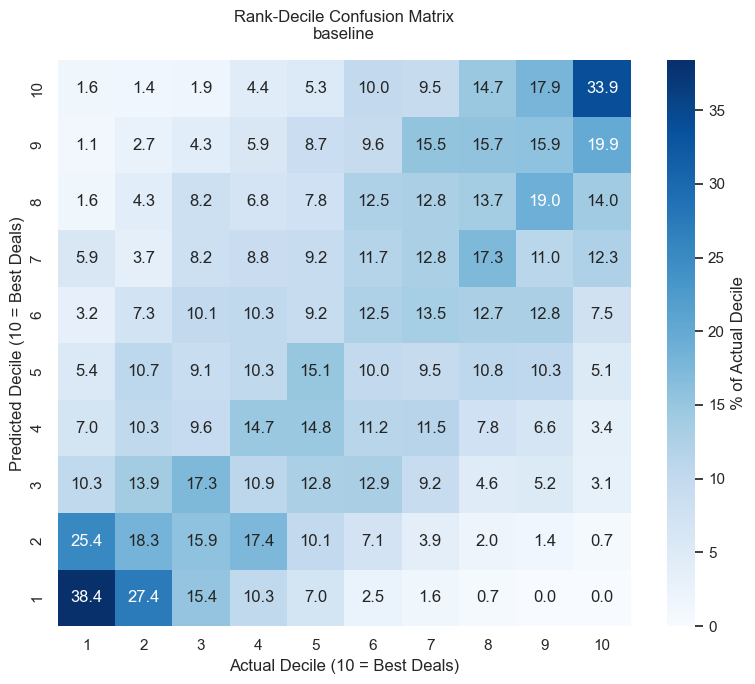

In [58]:
interactive_dataframe_selector(explorer.plot_rank_decile_matrix())

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('Gemma 4 Formative', 'Gemma 4 Ho…

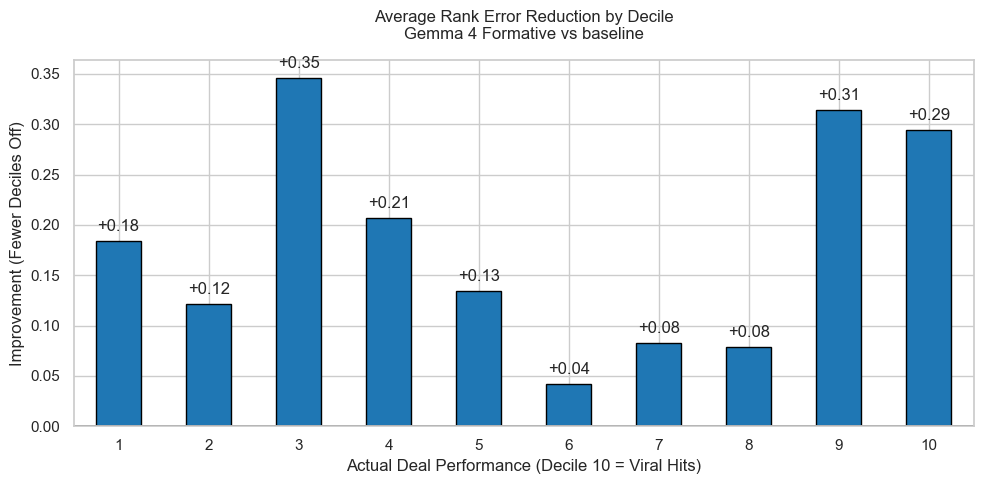

In [59]:
# 1. Generate the delta plots
decile_error_reduction_dict = explorer.plot_decile_error_reduction(
    baseline_label="baseline")

# 2. Render them interactively
interactive_dataframe_selector(decile_error_reduction_dict)

### Heteroskedasticity

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Gemma 4 Formative',…

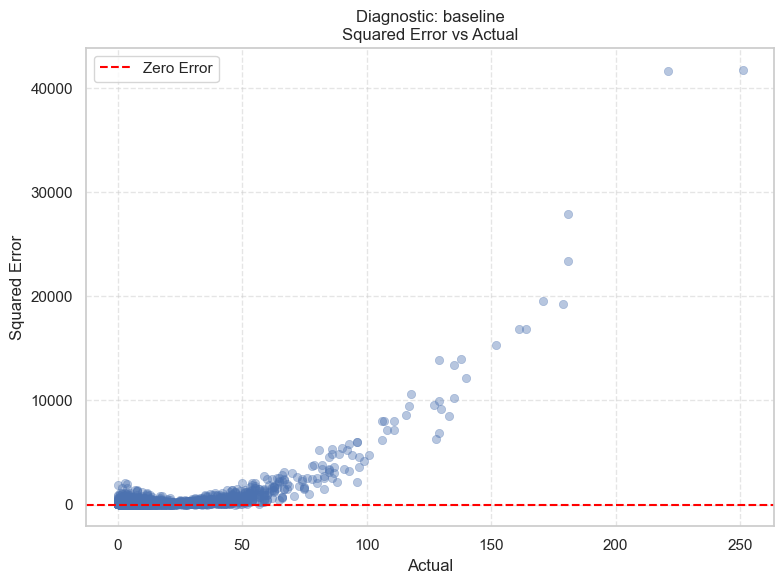

In [60]:
# 1. Diagnose heteroskedasticity (Does error variance explode at the right tail?)
sq_err_plots = explorer.plot_observation_level(x="actual", y="squared_error")

interactive_dataframe_selector(sq_err_plots)

### Rank degradation

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Gemma 4 Formative',…

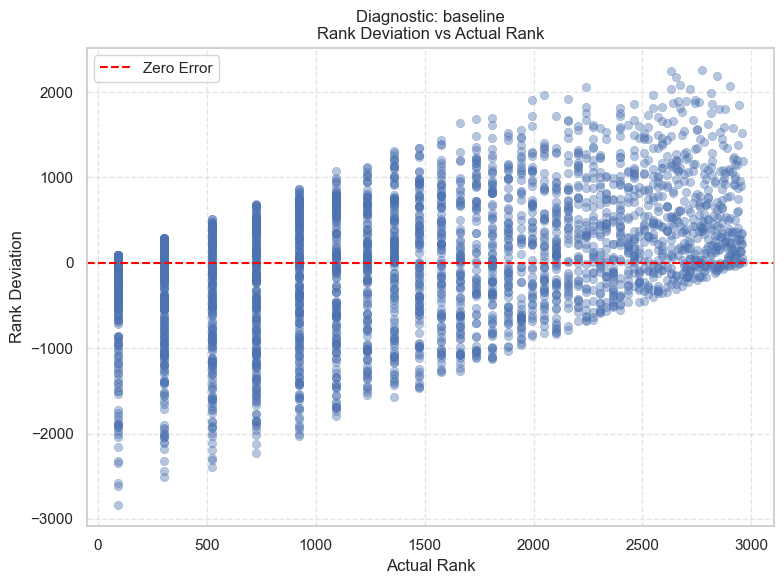

In [61]:
# 2. Diagnose rank degradation (Does the model fail strictly on magnitude, or does monotonic sorting break?)
# Plotting against actual_rank normalizes the x-axis to prevent visual crowding by extreme values
rank_dev_plots = explorer.plot_observation_level(
    x="actual_rank", y="rank_deviation")

interactive_dataframe_selector(rank_dev_plots)

### Prediction error

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Gemma 4 Formative',…

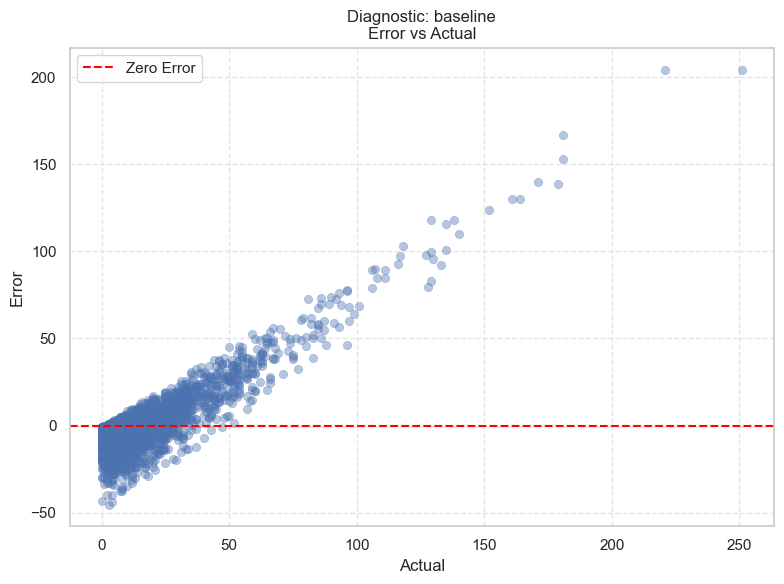

In [64]:
# 3. Assess absolute bias direction (Does it systematically underpredict high actuals?)
err_plots = explorer.plot_observation_level(x="actual", y="error")
interactive_dataframe_selector(err_plots)

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Gemma 4 Formative',…

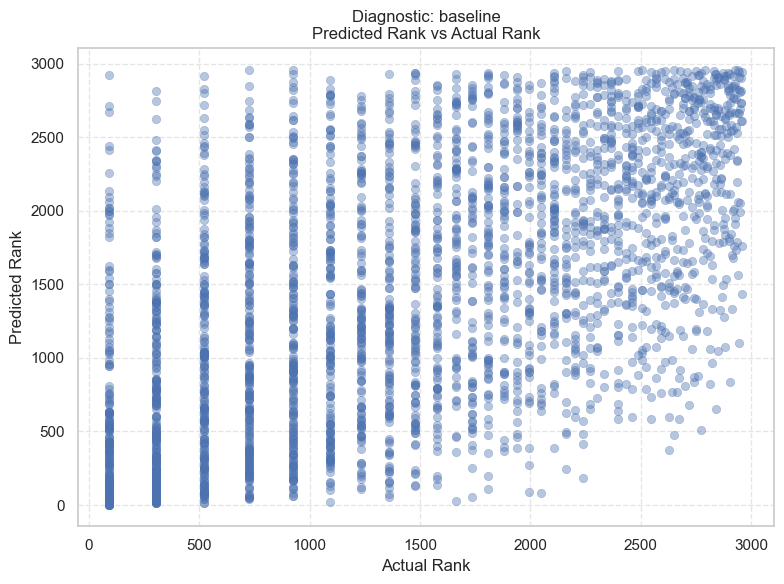

In [65]:
# This will generate exactly what ChatGPT asked for:
rank_scatter_figures = explorer.plot_observation_level(
    x="actual_rank",
    y="predicted_rank"
)
interactive_dataframe_selector(rank_scatter_figures)

## Cross-validation

In [67]:
from src.barter.cross_validation import cross_validate_barter_models

model_configs = {
    'Baseline': None,
    'Z-Mean Only': ['z_mean_rating'],
    'Z-Mean + Entropy': ['z_mean_rating', 'normalized_entropy']
}

cv_results_df = cross_validate_barter_models(
    df=final_df,  # Use your combined dataframe
    target_col='apps_after_7_days',
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col='partner_id',
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    model_configs=model_configs,
    n_splits=5
)

# Sort to easily see if Entropy improves the out-of-sample error
# print(cv_results_df.sort_values(['Experiment Group', 'RMSE (Mean)']))


--- Cross-validating group: ('Gemma 4', 'Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mean + Entropy CV complete.

--- Cross-validating group: ('Gemma 4', 'Holistic Naive') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mean + Entropy CV complete.

--- Cross-validating group: ('Gemma 4', 'Macro-Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mean + Entropy CV complete.

--- Cross-validating group: ('Llama 3.2', 'Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mean + Entropy CV complete.

--- Cross-validating group: ('Llama 3.2', 'Holistic Naive') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mean + Entropy CV complete.

--- Cross-validating group: ('Llama 3.2', 'Macro-Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mean + Entropy CV complete.

--- Cross-validating group: ('Qwen 3', 'Formative') ---
✓ Baseline CV complete.
✓ Z-Mean Only CV complete.
✓ Z-Mean + Entropy

In [68]:
cv_results_df

,Experiment Group,Model,RMSE (Mean),MAE (Mean),Poisson Dev (Mean),Pearson r (Mean),Spearman Rho (Mean),Kendall Tau (Mean)
0,Gemma 4 | Formative,Baseline,19.476527,11.703938,14.681921,0.392582,0.532587,0.377814
1,Gemma 4 | Formative,Z-Mean Only,18.881054,11.126928,13.228677,0.456139,0.600009,0.432289
2,Gemma 4 | Formative,Z-Mean + Entropy,18.857119,11.112976,13.203480,0.458711,0.599227,0.431772
3,Gemma 4 | Holistic Naive,Baseline,19.476562,11.703979,14.681985,0.392579,0.532578,0.377807
4,Gemma 4 | Holistic Naive,Z-Mean Only,19.470593,11.717246,14.599296,0.396125,0.538809,0.381246
5,Gemma 4 | Holistic Naive,Z-Mean + Entropy,19.475911,11.720490,14.611917,0.395728,0.539512,0.381713
6,Gemma 4 | Macro-Formative,Baseline,19.476523,11.703946,14.681928,0.392582,0.532580,0.377809
7,Gemma 4 | Macro-Formative,Z-Mean Only,19.505005,11.699291,14.637485,0.391647,0.535837,0.380541
8,Gemma 4 | Macro-Formative,Z-Mean + Entropy,19.506182,11.682905,14.675260,0.392597,0.537668,0.381810
9,Llama 3.2 | Formative,Baseline,19.476527,11.703938,14.681921,0.392582,0.532587,0.377814


# Variable selection

In [71]:
runner_mean_fin = create_regression_runner(
    target_col='apps_after_7_days',  # Log-transformed target
    # target_col='log_apps_after_7_days',  # Log-transformed target
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col='partner_id',
    model_type='negbin',
)

runner_mean_fin.run_baseline_model(
    df=og_df,
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    label="baseline"
)

predictor_names = ['mean_rating']

runner_mean_fin.run_regression(df=final_df,
                               cat_vars=CATEGORICALS,
                               bin_vars=BINARIES,
                               num_vars=CONTINUOUS,
                               predictor_names=predictor_names)

✓ Baseline model fitted: 2960 observations, AIC=21056.41


In [72]:
from src.barter.model_selection import EconometricFeatureSelector


# 2. Instantiate the functional selector
selector = EconometricFeatureSelector(
    categoricals=CATEGORICALS,
    continuous=CONTINUOUS,
    binaries=BINARIES
)

In [73]:
# 3. Effortlessly test across runners and alphas with zero code duplication
final_result, final_features = selector.fit(
    runner=runner_mean_fin,  # Or runner_mean_entr
    target_model_label="Qwen 3.5 Formative",
    method="backward",
    alpha=0.05
)

# 4. Review your pristine, academically isolated summary
final_result.summary()

[START] Starting Backward Elimination (alpha = 0.05)
[INFO] Safely locked 38 structural baseline levels/features.

[-] Dropping 'deal_pitch_brand_prestige_mean_rating' (clustered p-value: 0.9910)
[-] Dropping 'deal_pitch_proposition_clarity_mean_rating' (clustered p-value: 0.8628)
[-] Dropping 'deal_pitch_workload_volume_mean_rating' (clustered p-value: 0.5976)
[-] Dropping 'deal_pitch_creator_brand_alignment_mean_rating' (clustered p-value: 0.3716)
[-] Dropping 'deal_pitch_creative_restrictiveness_mean_rating' (clustered p-value: 0.3467)
[-] Dropping 'deal_pitch_rhetorical_objectivity_mean_rating' (clustered p-value: 0.1597)

[SUCCESS] Optimization complete! Remaining experimental features satisfy alpha = 0.05.

FINAL OPTIMIZED MODEL: Qwen 3.5 Formative (BACKWARD)


<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:      apps_after_7_days   No. Observations:                 2960
Model:               NegativeBinomial   Df Residuals:                     2918
Method:                           MLE   Df Model:                           41
Date:                Wed, 01 Jul 2026   Pseudo R-squ.:                 0.07490
Time:                        17:42:27   Log-Likelihood:                -10277.
converged:                       True   LL-Null:                       -11109.
Covariance Type:              cluster   LLR p-value:                     0.000
===================================================================================================================
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
const                                               0.2633      0.282      0.935      0.350      -0.288       0.815
deal_pitch_call_to_action_strength_mean_rating      0.0847      0.028      3.025      0.002       0.030       0.140
deal_pitch_functional_utility_mean_rating          -0.0647      0.029     -2.235      0.025      -0.121      -0.008
deal_pitch_perceived_economic_value_mean_rating     0.1791      0.029      6.071      0.000       0.121       0.237
deal_pitch_product_universality_mean_rating         0.4598      0.035     13.088      0.000       0.391       0.529
strict_follower_requirement                        -0.2245      0.055     -4.066      0.000      -0.333      -0.116
competitor_density                                 -0.0380      0.007     -5.364      0.000      -0.052      -0.024
market_scope_Tier1_NonNLD_international            -1.2735      0.205     -6.218      0.000      -1.675      -0.872
market_scope_Tier2_NLD_only                        -0.3493      0.060     -5.849      0.000      -0.466      -0.232
market_scope_Tier3_BEL_Only                        -1.2192      0.141     -8.662      0.000      -1.495      -0.943
market_scope_Tier4_Germany                         -1.7109      0.076    -22.505      0.000      -1.860      -1.562
market_scope_Tier5_Other                           -1.3929      0.152     -9.188      0.000      -1.690      -1.096
macro_category_Beauty                               0.3797      0.178      2.128      0.033       0.030       0.729
macro_category_Digital Entertainment               -0.1255      0.184     -0.681      0.496      -0.487       0.236
macro_category_Dining & Hospitality                -0.1262      0.188     -0.671      0.502      -0.495       0.242
macro_category_Family & Parenting                  -0.0604      0.204     -0.296      0.767      -0.460       0.339
macro_category_Fashion                              0.2264      0.186      1.220      0.222      -0.137       0.590
macro_category_Home Cooking & CPG                   0.1469      0.180      0.816      0.414      -0.206       0.500
macro_category_In-Person Experiences               -0.4597      0.224     -2.053      0.040      -0.899      -0.021
macro_category_Lifestyle & Home                     0.4565      0.191      2.394      0.017       0.083       0.830
macro_category_Tech & Niche                        -0.2378      0.235     -1.013      0.311      -0.698       0.222
macro_category_Uncategorized                       -0.1504      0.229     -0.657      0.511      -0.599       0.298
year_month_2025-06                                  0.2395      0.094      2.551      0.011       0.055       0.423
year_month_2025-07                                  0.4282      0.097      4.413      0.000       0.238       0.618
year_month_2025-08                                  0.1584      0.103      1.537      0.124      -0.044      

In [74]:
# 3. Effortlessly test across runners and alphas with zero code duplication
final_result, final_features = selector.fit(
    runner=runner_mean_fin,  # Or runner_mean_entr
    target_model_label="Qwen 3.5 Formative",
    method="backward",
    alpha=0.05
)

# 4. Review your pristine, academically isolated summary
final_result.summary()

[START] Starting Backward Elimination (alpha = 0.05)
[INFO] Safely locked 38 structural baseline levels/features.

[-] Dropping 'deal_pitch_brand_prestige_mean_rating' (clustered p-value: 0.9910)
[-] Dropping 'deal_pitch_proposition_clarity_mean_rating' (clustered p-value: 0.8628)
[-] Dropping 'deal_pitch_workload_volume_mean_rating' (clustered p-value: 0.5976)
[-] Dropping 'deal_pitch_creator_brand_alignment_mean_rating' (clustered p-value: 0.3716)
[-] Dropping 'deal_pitch_creative_restrictiveness_mean_rating' (clustered p-value: 0.3467)
[-] Dropping 'deal_pitch_rhetorical_objectivity_mean_rating' (clustered p-value: 0.1597)

[SUCCESS] Optimization complete! Remaining experimental features satisfy alpha = 0.05.

FINAL OPTIMIZED MODEL: Qwen 3.5 Formative (BACKWARD)


<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:      apps_after_7_days   No. Observations:                 2960
Model:               NegativeBinomial   Df Residuals:                     2918
Method:                           MLE   Df Model:                           41
Date:                Wed, 01 Jul 2026   Pseudo R-squ.:                 0.07490
Time:                        17:42:29   Log-Likelihood:                -10277.
converged:                       True   LL-Null:                       -11109.
Covariance Type:              cluster   LLR p-value:                     0.000
===================================================================================================================
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
const                                               0.2633      0.282      0.935      0.350      -0.288       0.815
deal_pitch_call_to_action_strength_mean_rating      0.0847      0.028      3.025      0.002       0.030       0.140
deal_pitch_functional_utility_mean_rating          -0.0647      0.029     -2.235      0.025      -0.121      -0.008
deal_pitch_perceived_economic_value_mean_rating     0.1791      0.029      6.071      0.000       0.121       0.237
deal_pitch_product_universality_mean_rating         0.4598      0.035     13.088      0.000       0.391       0.529
strict_follower_requirement                        -0.2245      0.055     -4.066      0.000      -0.333      -0.116
competitor_density                                 -0.0380      0.007     -5.364      0.000      -0.052      -0.024
market_scope_Tier1_NonNLD_international            -1.2735      0.205     -6.218      0.000      -1.675      -0.872
market_scope_Tier2_NLD_only                        -0.3493      0.060     -5.849      0.000      -0.466      -0.232
market_scope_Tier3_BEL_Only                        -1.2192      0.141     -8.662      0.000      -1.495      -0.943
market_scope_Tier4_Germany                         -1.7109      0.076    -22.505      0.000      -1.860      -1.562
market_scope_Tier5_Other                           -1.3929      0.152     -9.188      0.000      -1.690      -1.096
macro_category_Beauty                               0.3797      0.178      2.128      0.033       0.030       0.729
macro_category_Digital Entertainment               -0.1255      0.184     -0.681      0.496      -0.487       0.236
macro_category_Dining & Hospitality                -0.1262      0.188     -0.671      0.502      -0.495       0.242
macro_category_Family & Parenting                  -0.0604      0.204     -0.296      0.767      -0.460       0.339
macro_category_Fashion                              0.2264      0.186      1.220      0.222      -0.137       0.590
macro_category_Home Cooking & CPG                   0.1469      0.180      0.816      0.414      -0.206       0.500
macro_category_In-Person Experiences               -0.4597      0.224     -2.053      0.040      -0.899      -0.021
macro_category_Lifestyle & Home                     0.4565      0.191      2.394      0.017       0.083       0.830
macro_category_Tech & Niche                        -0.2378      0.235     -1.013      0.311      -0.698       0.222
macro_category_Uncategorized                       -0.1504      0.229     -0.657      0.511      -0.599       0.298
year_month_2025-06                                  0.2395      0.094      2.551      0.011       0.055       0.423
year_month_2025-07                                  0.4282      0.097      4.413      0.000       0.238       0.618
year_month_2025-08                                  0.1584      0.103      1.537      0.124      -0.044      

Both forward and backwards result in the same model, pointing towards the robustness of this specification.

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1. Filter for Qwen 3.5 Formative data
# (Make sure 'Qwen 3.5 Formative' matches your exact column label for the model)
qwen_condition = final_df['model_name_clean'].str.contains(
    'Qwen 3.5', case=False, na=False)
qwen_df = final_df[qwen_condition].copy()

# Focus strictly on the 4 winning dimensions that survived selection
core_dimensions = [
    'deal_pitch_product_universality_mean',
    'deal_pitch_perceived_economic_value_mean',
    'deal_pitch_call_to_action_strength_mean',
    'deal_pitch_functional_utility_mean'
]

# Clean string matching check against your analysis groups
qwen_core = qwen_df[qwen_df['analysis_group_full_clean'].str.lower(
).str.contains('universality|economic|action|utility', na=False)].copy()

print("="*60)
print("QWEN 3.5 FORMATIVE: RAW RATING DESCRIPTIVE METRICS")
print("="*60)

# 2. Generate a clean summary table of the raw scale metrics
stats_table = qwen_core.groupby('analysis_group_full_clean')['mean_rating'].describe()[
    ['count', 'min', '25%', '50%', '75%', 'max', 'std']
]
# Add a Range column (Max - Min) to see the absolute spread
stats_table['range'] = stats_table['max'] - stats_table['min']
print(stats_table.round(2))

QWEN 3.5 FORMATIVE: RAW RATING DESCRIPTIVE METRICS
                                                     count   min   25%   50%  \
analysis_group_full_clean                                                      
Qwen 3.5: Formative\nCall To Action Strength(Fo...  2960.0  1.18  2.55  3.16   
Qwen 3.5: Formative\nFunctional Utility(Formative)  2960.0  1.21  2.67  3.46   
Qwen 3.5: Formative\nPerceived Economic Value(F...  2960.0  1.24  2.56  3.03   
Qwen 3.5: Formative\nProduct Universality(Forma...  2960.0  1.65  3.34  3.91   

                                                     75%   max   std  range  
analysis_group_full_clean                                                    
Qwen 3.5: Formative\nCall To Action Strength(Fo...  3.82  6.63  0.96   5.45  
Qwen 3.5: Formative\nFunctional Utility(Formative)  4.30  6.79  1.04   5.58  
Qwen 3.5: Formative\nPerceived Economic Value(F...  3.75  6.51  0.86   5.27  
Qwen 3.5: Formative\nProduct Universality(Forma...  4.42  5.92  0.75   4.27  
